# Importing modules and settings

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc

In [ ]:
from matplotlib.pyplot import rc_context

In [ ]:
import seaborn as sns

General settings of Scanpy

In [ ]:
sc.settings.verbosity = 4
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')


scanpy==1.9.3 anndata==0.8.0 umap==0.5.2 numpy==1.23.5 scipy==1.9.3 pandas==1.4.3 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


In [ ]:
umap_cmap = sns.blend_palette(['xkcd:light grey', 'xkcd:azure'], as_cmap = True)

# Declaring the input and output files

In [ ]:
results_file = './h5ad_files/smed_size_analysis_202306.h5ad'

In [ ]:
adata = sc.read_10x_mtx(
    "../common_matrices/sizes230505/Sizes_matrix/",
    var_names='gene_symbols',
    cache=True)

... reading from cache file cache\..-common_matrices-sizes230505-Sizes_matrix-matrix.h5ad


In [ ]:
adata.var

,gene_ids,feature_types
h1SMcG0000001,h1SMcG0000001,Gene Expression
h1SMcG0000004,h1SMcG0000004,Gene Expression
h1SMcG0000006,h1SMcG0000006,Gene Expression
h1SMcG0000008,h1SMcG0000008,Gene Expression
h1SMcG0000009,h1SMcG0000009,Gene Expression
...,...,...
h1SMnG0035549,h1SMnG0035549,Gene Expression
h1SMnG0035561,h1SMnG0035561,Gene Expression
h1SMnG0035577,h1SMnG0035577,Gene Expression
h1SMnG0035583,h1SMnG0035583,Gene Expression


In [ ]:
adata.obs

""
L23_1_CATCAAGTGAACAGGCGTCTGTCA
L23_1_AACGCTTAACACAGAAAAGACGGA
L23_1_AGTCACTAGAACAGGCCGGATTGC
L23_1_CCGTGAGAGCTAACGACGCATACA
L23_1_CGACTGGAATAGCGACTATCAGCA
...
L23_2_ACAGCAGATCTTCACAAGATGTAC
L23_2_CACTTCGACATACCAACGCATACA
L23_2_AAACATCGATGCCTAACATACCAA
L23_2_ACAAGCTACATCAAGTGGAGAACA


In [ ]:
adata

AnnData object with n_obs × n_vars = 38576 × 41230
    var: 'gene_ids', 'feature_types'

# Reading the barcodes

In [ ]:
barcodes = pd.read_excel('barcodes sizes LMS.xlsx', header = None, index_col = 0)

In [ ]:
barcodes

,1,2
0,,
A1,AACGTGAT,L
A2,AAACATCG,L
A3,ATGCCTAA,L
A4,AGTGGTCA,L
A5,ACCACTGT,L
A6,ACATTGGC,L
A7,CAGATCTG,L
A8,CATCAAGT,L
A9,CGCTGATC,L


In [ ]:
barcodes.rename( columns = {1:'bc', 2: 'Size'}, inplace = True)

In [ ]:
barcodes.head(20)

,bc,Size
0,,
A1,AACGTGAT,L
A2,AAACATCG,L
A3,ATGCCTAA,L
A4,AGTGGTCA,L
A5,ACCACTGT,L
A6,ACATTGGC,L
A7,CAGATCTG,L
A8,CATCAAGT,L
A9,CGCTGATC,L


In [ ]:
barcodes['Size'] = barcodes['Size'].astype('category')

# Transfering the samples to adata.obs



In [ ]:
barcodes['Size']

0
A1     L
A2     L
A3     L
A4     L
A5     L
A6     L
A7     L
A8     L
A9     L
A10    L
A11    L
A12    L
B1     L
B2     L
B3     L
B4     L
B5     L
B6     L
B7     L
B8     L
B9     L
B10    L
B11    L
B12    L
C1     M
C2     M
C3     M
C4     M
C5     M
C6     M
C7     S
C8     S
C9     S
C10    S
C11    S
C12    S
D1     M
D2     M
D3     M
D4     M
D5     M
D6     M
D7     S
D8     S
D9     S
D10    S
D11    S
D12    S
Name: Size, dtype: category
Categories (3, object): ['L', 'M', 'S']

In [ ]:
for siz in barcodes['Size'].cat.categories:
    filt = (barcodes['Size'] == siz)
    li = barcodes[filt]['bc'].to_list()
    for bc in li:
        cellfilt = adata.obs.index.str.contains("_"+bc)
        adata.obs.loc[cellfilt, 'Size'] = barcodes[filt].iloc[0]['Size']

In [ ]:
adata.obs

,Size
L23_1_CATCAAGTGAACAGGCGTCTGTCA,L
L23_1_AACGCTTAACACAGAAAAGACGGA,L
L23_1_AGTCACTAGAACAGGCCGGATTGC,M
L23_1_CCGTGAGAGCTAACGACGCATACA,M
L23_1_CGACTGGAATAGCGACTATCAGCA,M
...,...
L23_2_ACAGCAGATCTTCACAAGATGTAC,L
L23_2_CACTTCGACATACCAACGCATACA,S
L23_2_AAACATCGATGCCTAACATACCAA,L
L23_2_ACAAGCTACATCAAGTGGAGAACA,L


In [ ]:
check = 'ACATTGGC'

In [ ]:
cfilt = adata.obs.index.str.contains("_"+check)

In [ ]:
adata.obs[cfilt]

,Size
L23_1_ACATTGGCTGGAACAAAGCCATGC,L
L23_1_ACATTGGCAGCCATGCCAGCGTTA,L
L23_1_ACATTGGCAACGTGATAGTACAAG,L
L23_1_ACATTGGCCTGAGCCAACAGCAGA,L
L23_1_ACATTGGCCATACCAAGAGCTGAA,L
...,...
L23_2_ACATTGGCAGGCTAACACAGATTC,L
L23_2_ACATTGGCAACTCACCAAGGTACA,L
L23_2_ACATTGGCAAGGTACAAGGCTAAC,L
L23_2_ACATTGGCAGCCATGCGATAGACA,L


Annotating the two different libraries in adata.obs

In [ ]:
libfilt = adata.obs.index.str.contains('L23_1_')

In [ ]:
adata.obs.loc[libfilt, 'Library'] = "L1"

In [ ]:
libfilt = adata.obs.index.str.contains('L23_2_')

In [ ]:
adata.obs.loc[libfilt, 'Library'] = "L2"

In [ ]:
adata.obs

,Size,Library
L23_1_CATCAAGTGAACAGGCGTCTGTCA,L,L1
L23_1_AACGCTTAACACAGAAAAGACGGA,L,L1
L23_1_AGTCACTAGAACAGGCCGGATTGC,M,L1
L23_1_CCGTGAGAGCTAACGACGCATACA,M,L1
L23_1_CGACTGGAATAGCGACTATCAGCA,M,L1
...,...,...
L23_2_ACAGCAGATCTTCACAAGATGTAC,L,L2
L23_2_CACTTCGACATACCAACGCATACA,S,L2
L23_2_AAACATCGATGCCTAACATACCAA,L,L2
L23_2_ACAAGCTACATCAAGTGGAGAACA,L,L2




```
# This is formatted as code
```

and this annotates each cell in an individual sample (size plus replicate)

In [ ]:
adata.obs['Sample'] = adata.obs['Size'] + "_" + adata.obs['Library']

In [ ]:
adata.obs

,Size,Library,Sample
L23_1_CATCAAGTGAACAGGCGTCTGTCA,L,L1,L_L1
L23_1_AACGCTTAACACAGAAAAGACGGA,L,L1,L_L1
L23_1_AGTCACTAGAACAGGCCGGATTGC,M,L1,M_L1
L23_1_CCGTGAGAGCTAACGACGCATACA,M,L1,M_L1
L23_1_CGACTGGAATAGCGACTATCAGCA,M,L1,M_L1
...,...,...,...
L23_2_ACAGCAGATCTTCACAAGATGTAC,L,L2,L_L2
L23_2_CACTTCGACATACCAACGCATACA,S,L2,S_L2
L23_2_AAACATCGATGCCTAACATACCAA,L,L2,L_L2
L23_2_ACAAGCTACATCAAGTGGAGAACA,L,L2,L_L2


In [ ]:
adata.obs['Size'].value_counts()

L    18289
S    10753
M     9534
Name: Size, dtype: int64

In [ ]:
adata.obs['Size'] = adata.obs['Size'].astype('category')

In [ ]:
adata.obs['Size'].cat.reorder_categories(['L', 'M', 'S'], inplace = True)

<ipython-input-31-0680ff4ad694>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['Size'].cat.reorder_categories(['L', 'M', 'S'], inplace = True)


# Annotating the adata.var dataframe

In [ ]:
ann = pd.read_csv('../annots/20230531_Smed_Rink_Simplified_Annotation_Table.tsv', sep = '\t', index_col = 'gene')

In [ ]:
ann

,longest_isoform,gene_type,gene_JakkeGuo,gene_Jakke_ver1,gene_ddv6,jakkeguo_collapsed,jakke_ver1_collapsed,ddv6_collapsed,Preferred_name,Description,PFAMs
gene,,,,,,,,,,,
h1SMcG0000001,h1SMcT0000001.1,other,-,-,dd_Smed_v6_17026_0_4,SMEST050392001.1,SMESG000050392.1,"dd_Smed_v6_17026_0_4,dd_Smed_v6_17026_0_5",-,-,RVT_1
h1SMcG0000002,h1SMcT0000002.1,other,-,-,-,-,-,-,-,K02A2.6-like,"DUF1759,RVP_2,RVT_1,SCAN,SRCR,gag-asp_proteas,..."
h1SMcG0000003,h1SMcT0000003.1,other,-,-,-,-,-,-,-,Ribonuclease H protein,"C2,Dimer_Tnp_hAT,Exo_endo_phos,Ig_2,Nucleopori..."
h1SMcG0000004,h1SMcT0000004.1,other,-,-,-,-,-,-,-,-,-
h1SMcG0000005,h1SMcT0000005.1,other,-,-,-,-,-,dd_Smed_v6_10407_0_52,-,-,-
...,...,...,...,...,...,...,...,...,...,...,...
h1SMnG0035615,h1SMnT0035615.1,other,-,-,-,-,-,-,-,-,-
h1SMnG0035616,h1SMnT0035616.1,hconf,-,-,-,-,-,-,-,-,-
h1SMnG0035617,h1SMnT0035617.1,other,-,-,-,-,-,-,-,-,-


In [ ]:
ann.columns

Index(['longest_isoform', 'gene_type', 'gene_JakkeGuo', 'gene_Jakke_ver1',
       'gene_ddv6', 'jakkeguo_collapsed', 'jakke_ver1_collapsed',
       'ddv6_collapsed', 'Preferred_name', 'Description', 'PFAMs'],
      dtype='object')

In [ ]:
len(ann.columns)

11

In [ ]:
adata.var

,gene_ids,feature_types
h1SMcG0000001,h1SMcG0000001,Gene Expression
h1SMcG0000004,h1SMcG0000004,Gene Expression
h1SMcG0000006,h1SMcG0000006,Gene Expression
h1SMcG0000008,h1SMcG0000008,Gene Expression
h1SMcG0000009,h1SMcG0000009,Gene Expression
...,...,...
h1SMnG0035549,h1SMnG0035549,Gene Expression
h1SMnG0035561,h1SMnG0035561,Gene Expression
h1SMnG0035577,h1SMnG0035577,Gene Expression
h1SMnG0035583,h1SMnG0035583,Gene Expression


In [ ]:
adata.var = pd.concat([adata.var, ann], axis = 1, join = 'inner')

In [ ]:
adata.var

,gene_ids,feature_types,longest_isoform,gene_type,gene_JakkeGuo,gene_Jakke_ver1,gene_ddv6,jakkeguo_collapsed,jakke_ver1_collapsed,ddv6_collapsed,Preferred_name,Description,PFAMs
h1SMcG0000001,h1SMcG0000001,Gene Expression,h1SMcT0000001.1,other,-,-,dd_Smed_v6_17026_0_4,SMEST050392001.1,SMESG000050392.1,"dd_Smed_v6_17026_0_4,dd_Smed_v6_17026_0_5",-,-,RVT_1
h1SMcG0000004,h1SMcG0000004,Gene Expression,h1SMcT0000004.1,other,-,-,-,-,-,-,-,-,-
h1SMcG0000006,h1SMcG0000006,Gene Expression,h1SMcT0000006.1,other,-,-,-,-,-,-,-,-,-
h1SMcG0000008,h1SMcG0000008,Gene Expression,h1SMcT0000008.1,hconf,SMEST029651001.1,MSTRG.9911,dd_Smed_v6_35379_0_1,"SMEST029651001.1,SMEST029651002.1,SmMSTRG.9911...",MSTRG.9911,dd_Smed_v6_35379_0_1,isl1,Insulin gene enhancer protein,"Homeobox,LIM"
h1SMcG0000009,h1SMcG0000009,Gene Expression,h1SMcT0000009.2,hconf,SMEST029652002.1,MSTRG.9914,dd_Smed_v6_5323_0_1,"SMEST029652002.1,SmMSTRG.9914.2,SmMSTRG.9914.3...",MSTRG.9914,dd_Smed_v6_5323_0_1,RASSF1,negative regulation of cell cycle arrest,"C1_1,Nore1-SARAH,RA"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
h1SMnG0035549,h1SMnG0035549,Gene Expression,h1SMnT0035549.1,other,-,-,-,-,-,-,-,-,-
h1SMnG0035561,h1SMnG0035561,Gene Expression,h1SMnT0035561.1,other,-,-,-,-,-,-,-,-,-
h1SMnG0035577,h1SMnG0035577,Gene Expression,h1SMnT0035577.1,other,-,-,-,-,-,-,-,-,-
h1SMnG0035583,h1SMnG0035583,Gene Expression,h1SMnT0035583.1,other,-,-,-,-,-,-,-,-,-


# Preprocessing

normalizing counts per cell
    finished (0:00:00)


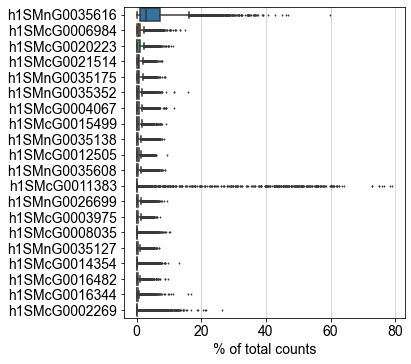

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [ ]:
sc.pp.filter_cells(adata, min_counts=100)
sc.pp.filter_cells(adata, min_genes= 100) 

filtered out 8516 cells that have less than 100 counts
filtered out 1245 cells that have less than 100 genes expressed


In [ ]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

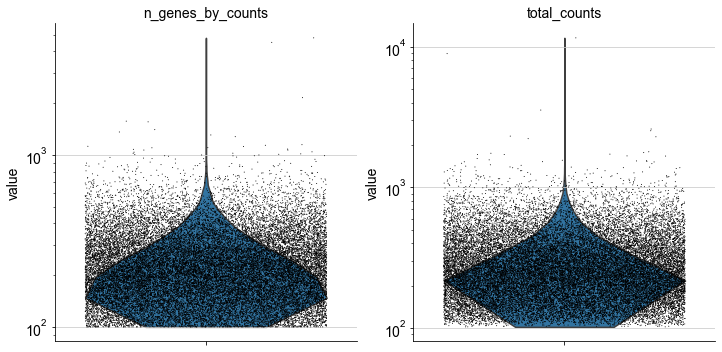

In [ ]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, log = True)

In [ ]:
adata.var

,gene_ids,feature_types,longest_isoform,gene_type,gene_JakkeGuo,gene_Jakke_ver1,gene_ddv6,jakkeguo_collapsed,jakke_ver1_collapsed,ddv6_collapsed,Preferred_name,Description,PFAMs,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
h1SMcG0000001,h1SMcG0000001,Gene Expression,h1SMcT0000001.1,other,-,-,dd_Smed_v6_17026_0_4,SMEST050392001.1,SMESG000050392.1,"dd_Smed_v6_17026_0_4,dd_Smed_v6_17026_0_5",-,-,RVT_1,False,68,0.002499,99.764012,72.0
h1SMcG0000004,h1SMcG0000004,Gene Expression,h1SMcT0000004.1,other,-,-,-,-,-,-,-,-,-,False,4,0.000139,99.986118,4.0
h1SMcG0000006,h1SMcG0000006,Gene Expression,h1SMcT0000006.1,other,-,-,-,-,-,-,-,-,-,False,55,0.001943,99.809127,56.0
h1SMcG0000008,h1SMcG0000008,Gene Expression,h1SMcT0000008.1,hconf,SMEST029651001.1,MSTRG.9911,dd_Smed_v6_35379_0_1,"SMEST029651001.1,SMEST029651002.1,SmMSTRG.9911...",MSTRG.9911,dd_Smed_v6_35379_0_1,isl1,Insulin gene enhancer protein,"Homeobox,LIM",False,3,0.000104,99.989589,3.0
h1SMcG0000009,h1SMcG0000009,Gene Expression,h1SMcT0000009.2,hconf,SMEST029652002.1,MSTRG.9914,dd_Smed_v6_5323_0_1,"SMEST029652002.1,SmMSTRG.9914.2,SmMSTRG.9914.3...",MSTRG.9914,dd_Smed_v6_5323_0_1,RASSF1,negative regulation of cell cycle arrest,"C1_1,Nore1-SARAH,RA",False,173,0.006108,99.399618,176.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
h1SMnG0035549,h1SMnG0035549,Gene Expression,h1SMnT0035549.1,other,-,-,-,-,-,-,-,-,-,False,0,0.000000,100.000000,0.0
h1SMnG0035561,h1SMnG0035561,Gene Expression,h1SMnT0035561.1,other,-,-,-,-,-,-,-,-,-,False,2,0.000069,99.993059,2.0
h1SMnG0035577,h1SMnG0035577,Gene Expression,h1SMnT0035577.1,other,-,-,-,-,-,-,-,-,-,False,2,0.000069,99.993059,2.0
h1SMnG0035583,h1SMnG0035583,Gene Expression,h1SMnT0035583.1,other,-,-,-,-,-,-,-,-,-,False,1,0.000035,99.996530,1.0


In [ ]:
adata

AnnData object with n_obs × n_vars = 28815 × 41230
    obs: 'Size', 'Library', 'Sample', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'longest_isoform', 'gene_type', 'gene_JakkeGuo', 'gene_Jakke_ver1', 'gene_ddv6', 'jakkeguo_collapsed', 'jakke_ver1_collapsed', 'ddv6_collapsed', 'Preferred_name', 'Description', 'PFAMs', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

# Matrix slicing and normalization

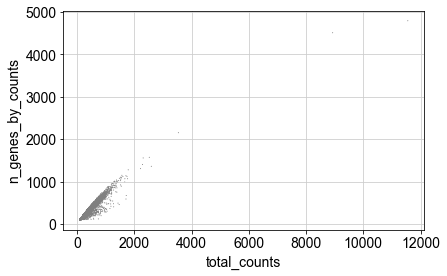

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
adata = adata[adata.obs.n_genes_by_counts < 900, :]

In [ ]:
adata = adata[adata.obs.total_counts < 1200, :]

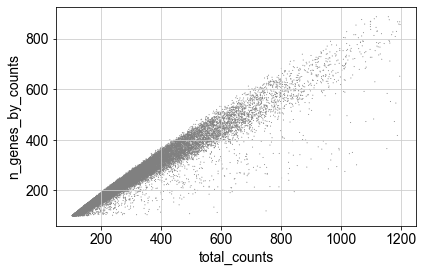

In [ ]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [ ]:
sc.pp.normalize_total(adata)

normalizing counts per cell
    finished (0:00:00)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [ ]:
sc.pp.log1p(adata)

# Selecting highly variable genes

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes = 24000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    Gene indices [36089] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    the 24000 top genes correspond to a normalized dispersion cutoff of 0.09527054928496305
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


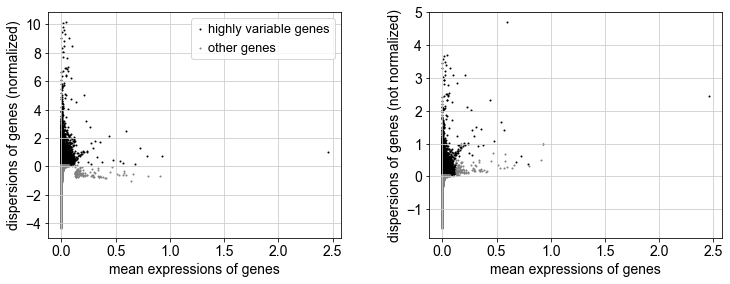

In [ ]:
sc.pl.highly_variable_genes(adata)

In [ ]:
adata.raw = adata

In [ ]:
adata = adata[:, adata.var.highly_variable]

In [ ]:
adata

View of AnnData object with n_obs × n_vars = 28738 × 24000
    obs: 'Size', 'Library', 'Sample', 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'longest_isoform', 'gene_type', 'gene_JakkeGuo', 'gene_Jakke_ver1', 'gene_ddv6', 'jakkeguo_collapsed', 'jakke_ver1_collapsed', 'ddv6_collapsed', 'Preferred_name', 'Description', 'PFAMs', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [ ]:
adata.raw.var

,gene_ids,feature_types,longest_isoform,gene_type,gene_JakkeGuo,gene_Jakke_ver1,gene_ddv6,jakkeguo_collapsed,jakke_ver1_collapsed,ddv6_collapsed,...,PFAMs,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm
h1SMcG0000001,h1SMcG0000001,Gene Expression,h1SMcT0000001.1,other,-,-,dd_Smed_v6_17026_0_4,SMEST050392001.1,SMESG000050392.1,"dd_Smed_v6_17026_0_4,dd_Smed_v6_17026_0_5",...,RVT_1,False,68,0.002499,99.764012,72.0,True,2.016060e-03,0.187538,0.499244
h1SMcG0000004,h1SMcG0000004,Gene Expression,h1SMcT0000004.1,other,-,-,-,-,-,-,...,-,False,4,0.000139,99.986118,4.0,False,6.444002e-05,-0.614393,-1.712241
h1SMcG0000006,h1SMcG0000006,Gene Expression,h1SMcT0000006.1,other,-,-,-,-,-,-,...,-,False,55,0.001943,99.809127,56.0,False,1.304251e-03,-0.107310,-0.313860
h1SMcG0000008,h1SMcG0000008,Gene Expression,h1SMcT0000008.1,hconf,SMEST029651001.1,MSTRG.9911,dd_Smed_v6_35379_0_1,"SMEST029651001.1,SMEST029651002.1,SmMSTRG.9911...",MSTRG.9911,dd_Smed_v6_35379_0_1,...,"Homeobox,LIM",False,3,0.000104,99.989589,3.0,False,9.324870e-05,-0.020406,-0.074203
h1SMcG0000009,h1SMcG0000009,Gene Expression,h1SMcT0000009.2,hconf,SMEST029652002.1,MSTRG.9914,dd_Smed_v6_5323_0_1,"SMEST029652002.1,SmMSTRG.9914.2,SmMSTRG.9914.3...",MSTRG.9914,dd_Smed_v6_5323_0_1,...,"C1_1,Nore1-SARAH,RA",False,173,0.006108,99.399618,176.0,True,5.308696e-03,0.118957,0.310118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
h1SMnG0035549,h1SMnG0035549,Gene Expression,h1SMnT0035549.1,other,-,-,-,-,-,-,...,-,False,0,0.000000,100.000000,0.0,False,1.000000e-12,NaN,NaN
h1SMnG0035561,h1SMnG0035561,Gene Expression,h1SMnT0035561.1,other,-,-,-,-,-,-,...,-,False,2,0.000069,99.993059,2.0,True,8.600330e-05,0.253502,0.681151
h1SMnG0035577,h1SMnG0035577,Gene Expression,h1SMnT0035577.1,other,-,-,-,-,-,-,...,-,False,2,0.000069,99.993059,2.0,False,3.242494e-05,-0.753512,-2.095890
h1SMnG0035583,h1SMnG0035583,Gene Expression,h1SMnT0035583.1,other,-,-,-,-,-,-,...,-,False,1,0.000035,99.996530,1.0,False,1.560286e-05,-0.802073,-2.229807


# Scaling the data

In [ ]:
sc.pp.scale(adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


# Performing the PCA and kNN analysis

In [ ]:
sc.tl.pca(adata, svd_solver='arpack', n_comps = 150)

computing PCA
    on highly variable genes
    with n_comps=150
    finished (0:02:54)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


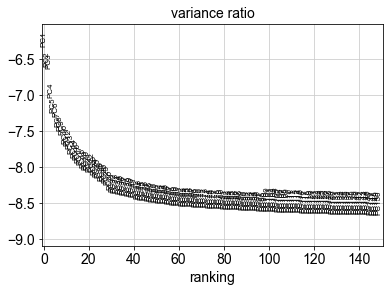

In [ ]:
sc.pl.pca_variance_ratio(adata, n_pcs=150, log=True)

In [ ]:
sc.pp.neighbors(adata, n_neighbors=55, n_pcs=95)

computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 95
    computed neighbors (0:03:10)
    computed connectivities (0:00:03)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:03:13)


In [ ]:
sc.tl.umap(adata, min_dist=0.75, spread = 1.25, alpha = 1, gamma = 1.0)

computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


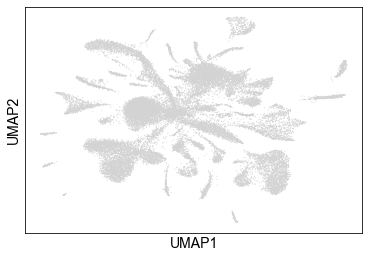

In [ ]:
sc.pl.umap(adata)

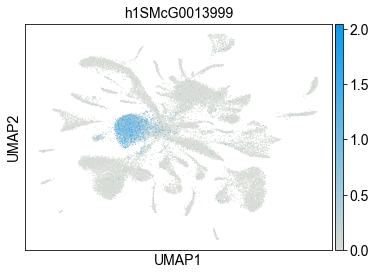

In [ ]:
#Smedwi1
sc.pl.umap(adata, color=['h1SMcG0013999'], cmap = umap_cmap)

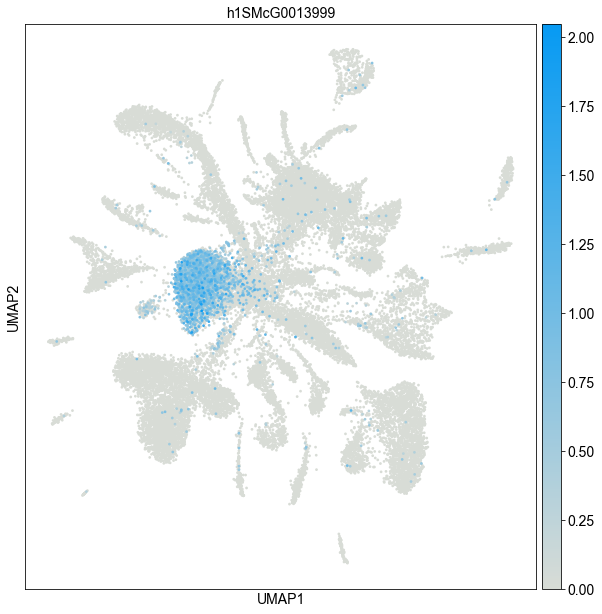

In [ ]:
#Smedwi1
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color=['h1SMcG0013999'], size = 30, color_map = umap_cmap)

# Clustering

In [ ]:
resolutions = [1, 2, 3, 4]

running Leiden clustering
    finished: found 40 clusters and added
    'leiden_1', the cluster labels (adata.obs, categorical) (0:00:09)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


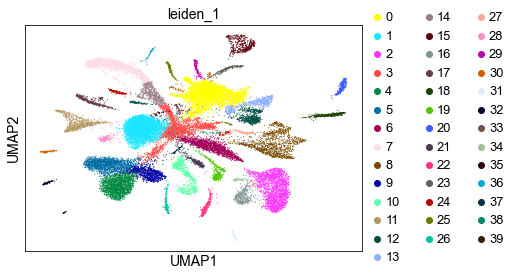

running Leiden clustering
    finished: found 55 clusters and added
    'leiden_2', the cluster labels (adata.obs, categorical) (0:00:07)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


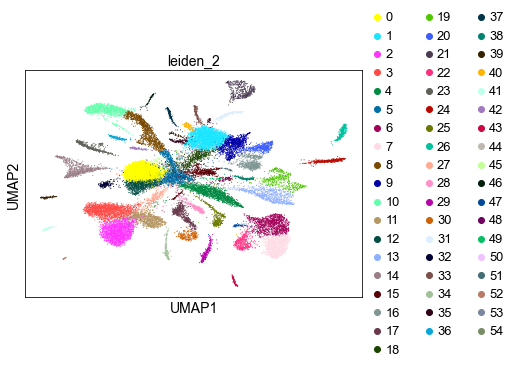

running Leiden clustering
    finished: found 65 clusters and added
    'leiden_3', the cluster labels (adata.obs, categorical) (0:00:06)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


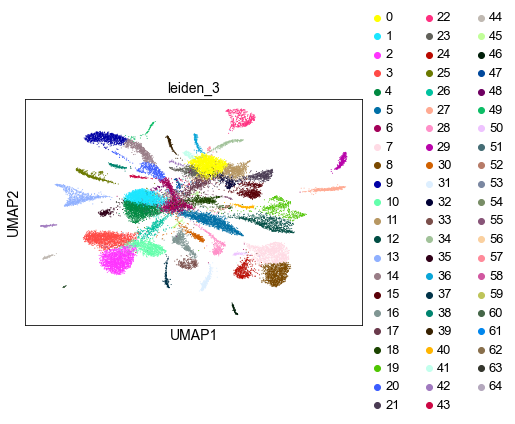

running Leiden clustering
    finished: found 73 clusters and added
    'leiden_4', the cluster labels (adata.obs, categorical) (0:00:07)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


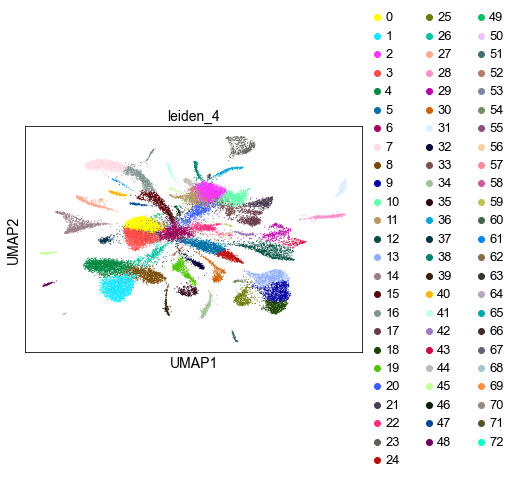

In [ ]:
for i in resolutions:
    sc.tl.leiden(adata, resolution = i, key_added = 'leiden_'+str(i))
    sc.pl.umap(adata, color='leiden_'+str(i))

In [ ]:
leiden_names = adata.obs.columns[adata.obs.columns.str.contains('leiden')].to_list()

In [ ]:
leiden_names

['leiden_1', 'leiden_2', 'leiden_3', 'leiden_4']

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


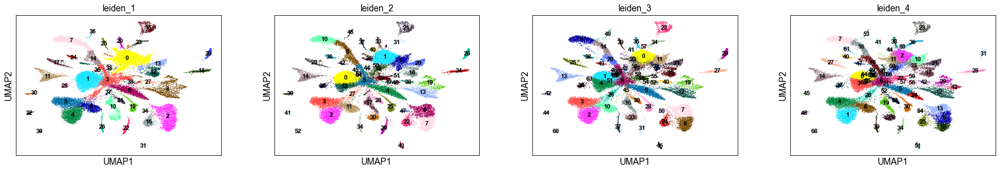

In [ ]:
sc.pl.umap(adata, color=leiden_names, legend_loc = 'on data', legend_fontsize = 10)

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


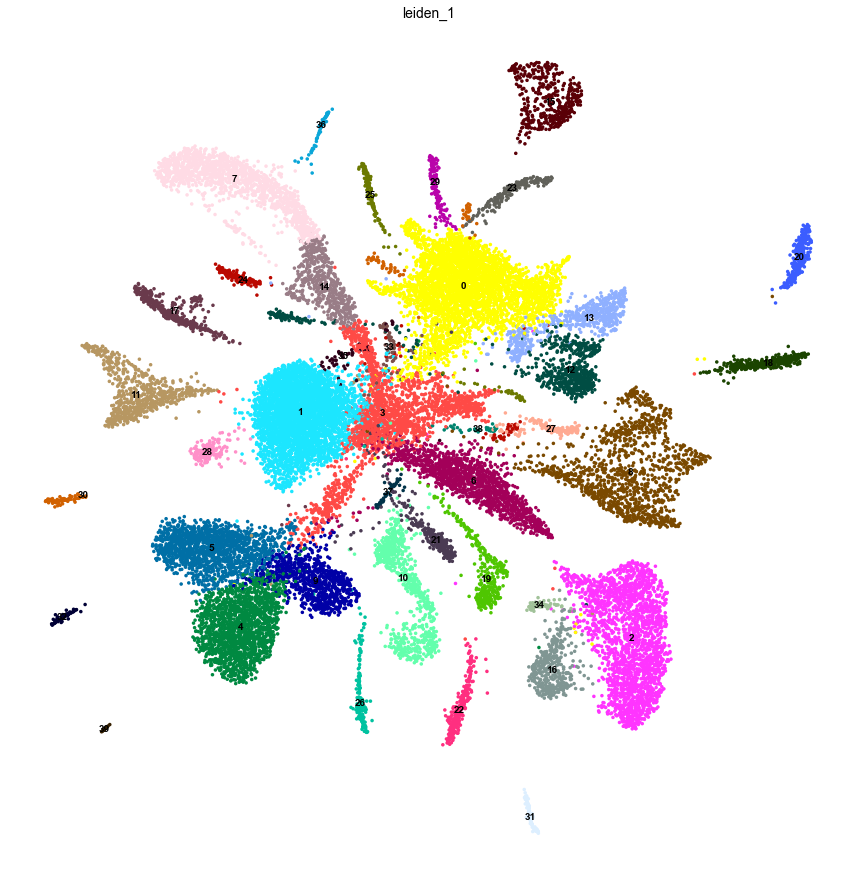

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


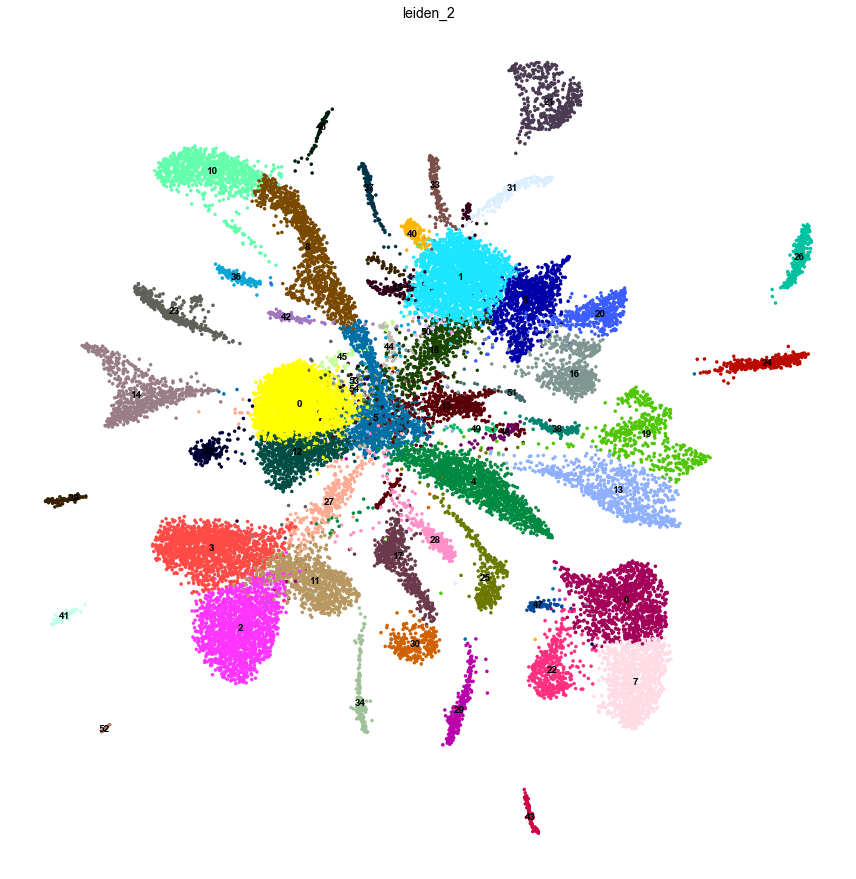

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


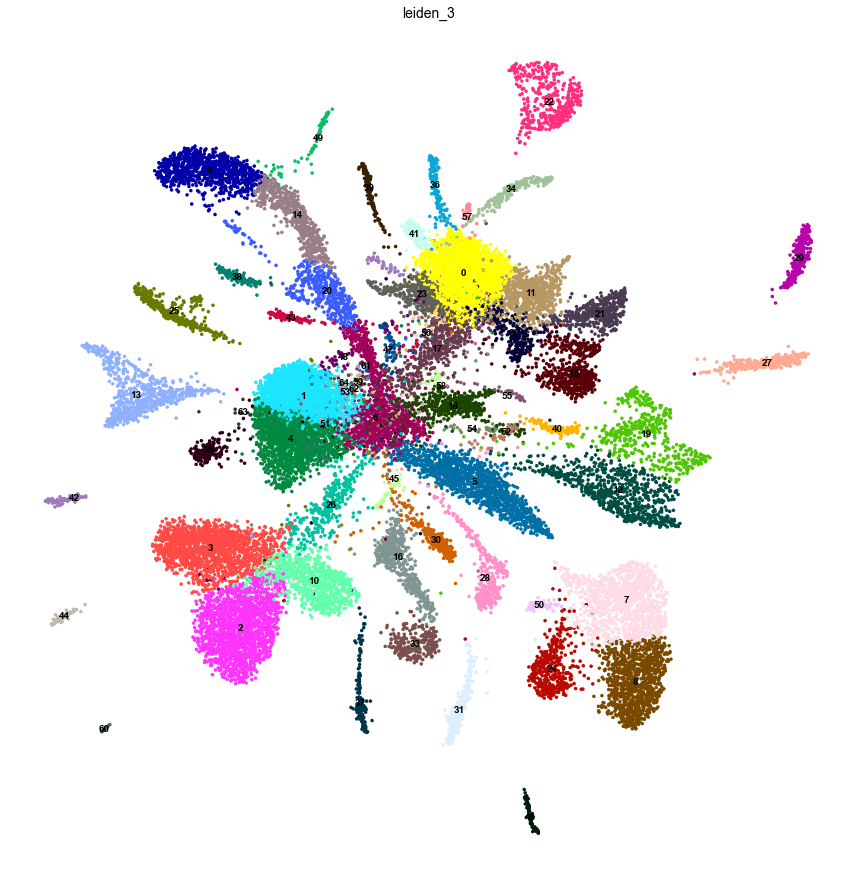

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


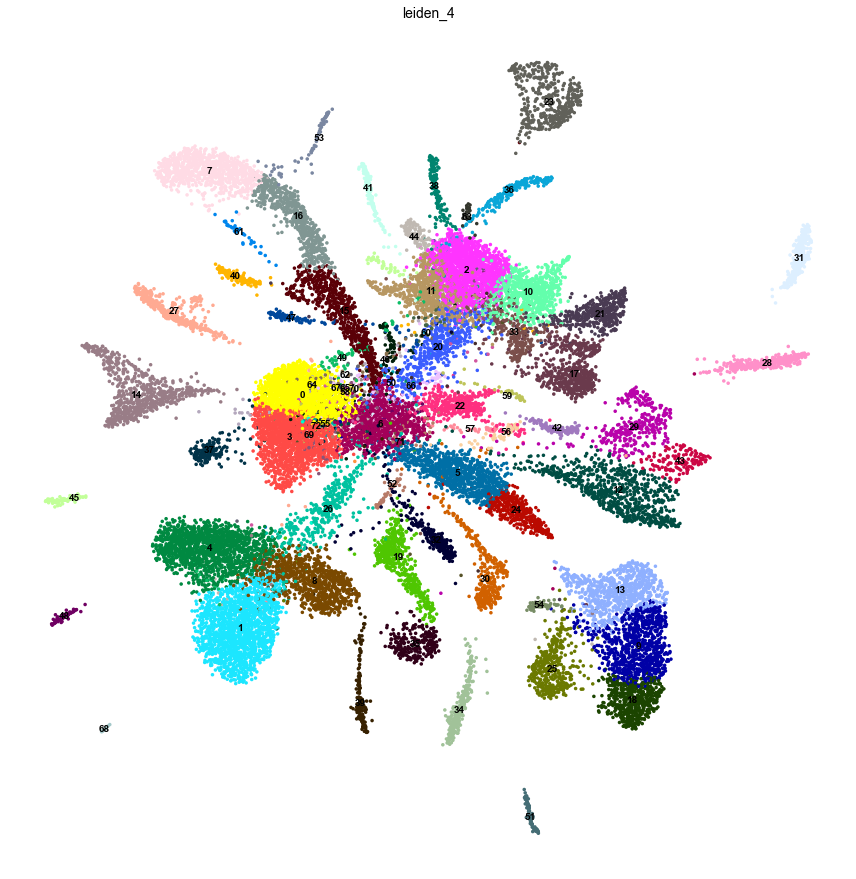

In [ ]:
for leiden_i in leiden_names:
    with rc_context({'figure.figsize': (15, 15)}):
        sc.pl.umap(adata, color=leiden_i, legend_loc='on data', title=str(leiden_i), size = 50, frameon=False, 
                   save = '_'+str(leiden_i))

    using 'X_pca' with n_pcs = 150
Storing dendrogram info using `.uns['dendrogram_leiden_1']`


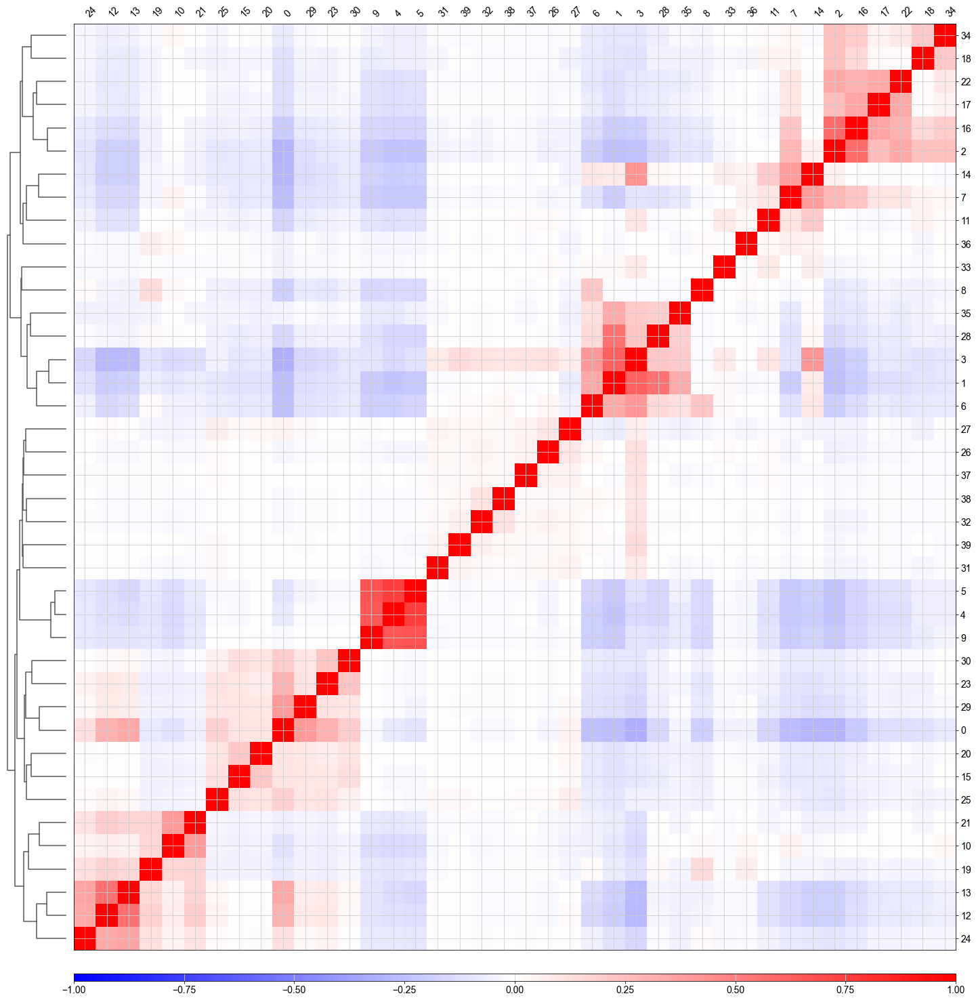

    using 'X_pca' with n_pcs = 150
Storing dendrogram info using `.uns['dendrogram_leiden_2']`


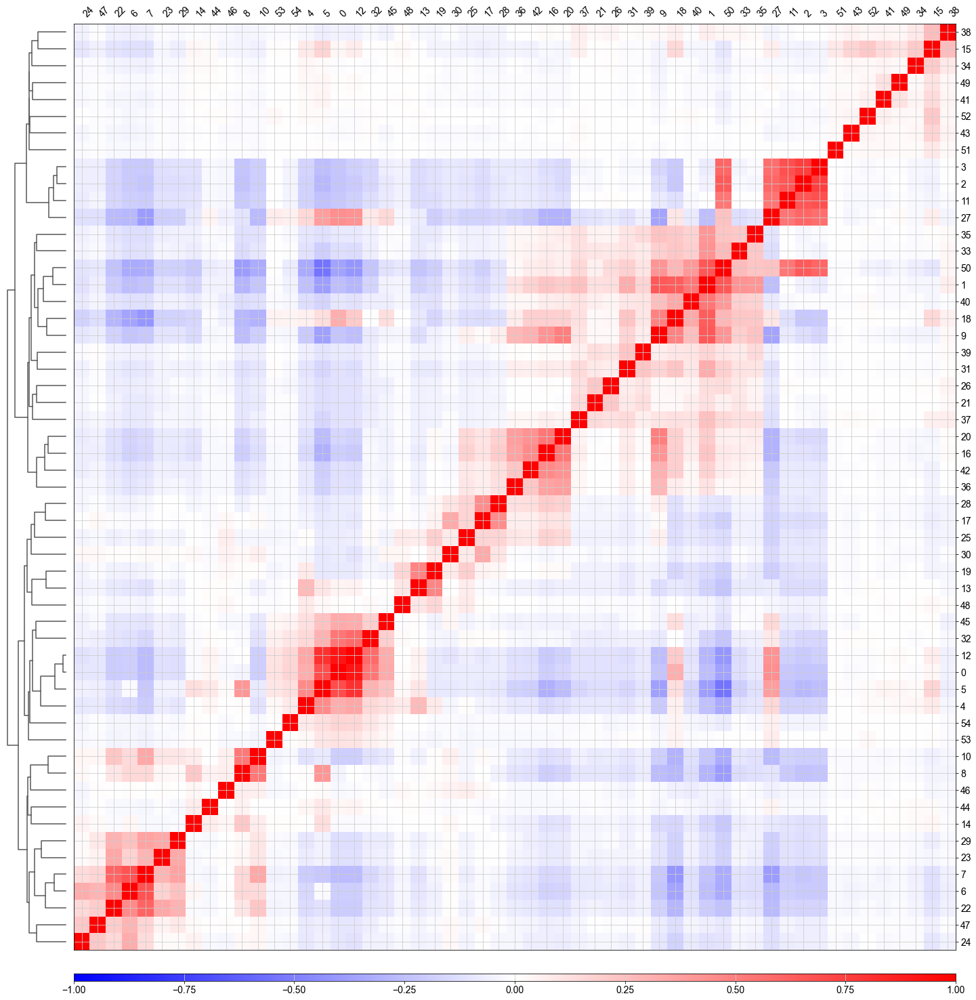

    using 'X_pca' with n_pcs = 150
Storing dendrogram info using `.uns['dendrogram_leiden_3']`


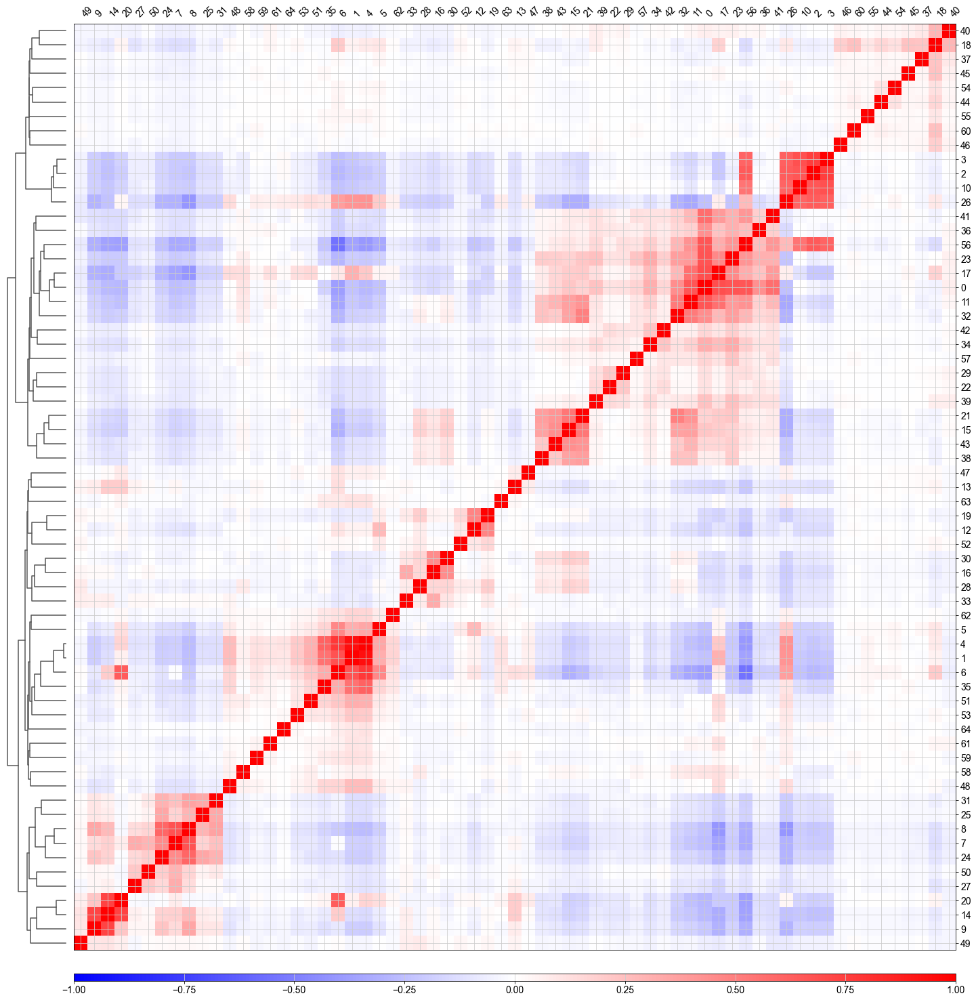

    using 'X_pca' with n_pcs = 150
Storing dendrogram info using `.uns['dendrogram_leiden_4']`


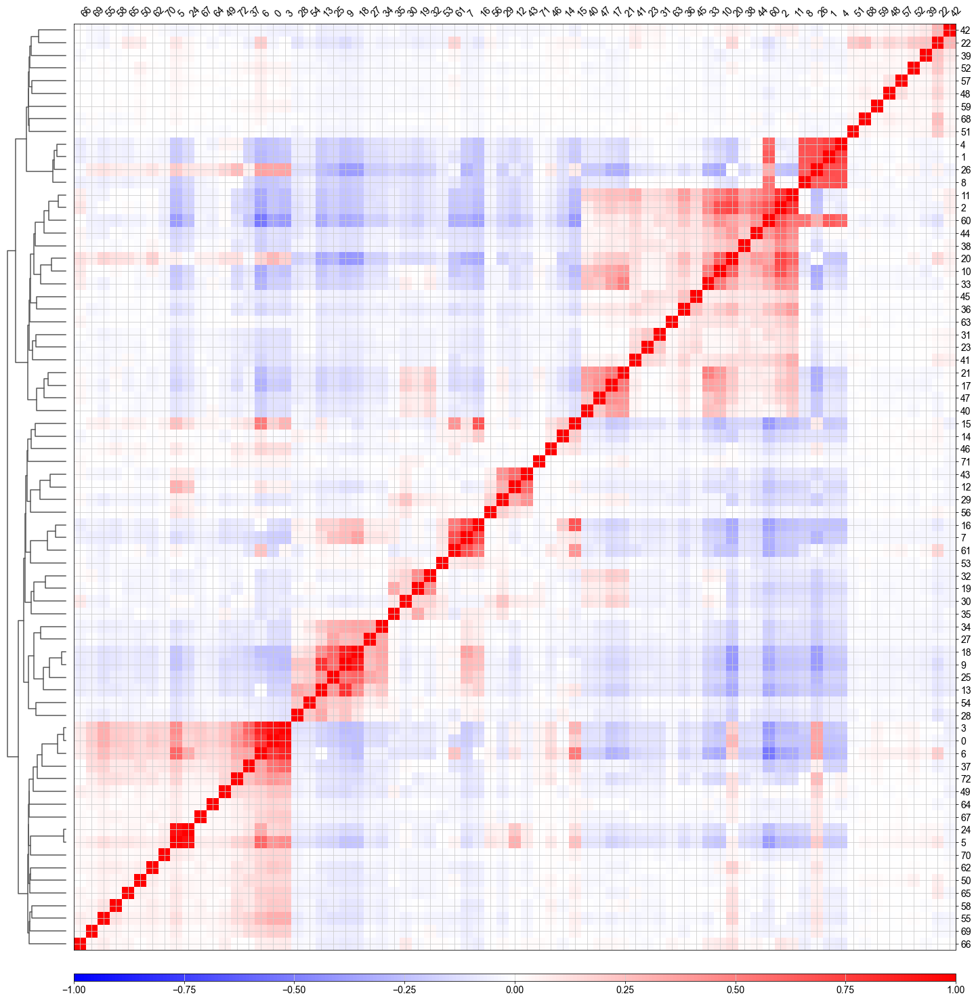

In [ ]:
for leiden_i in leiden_names:
    sc.pl.correlation_matrix(adata, leiden_i, figsize=(25,25),
                            save = '_'+str(leiden_i))
    

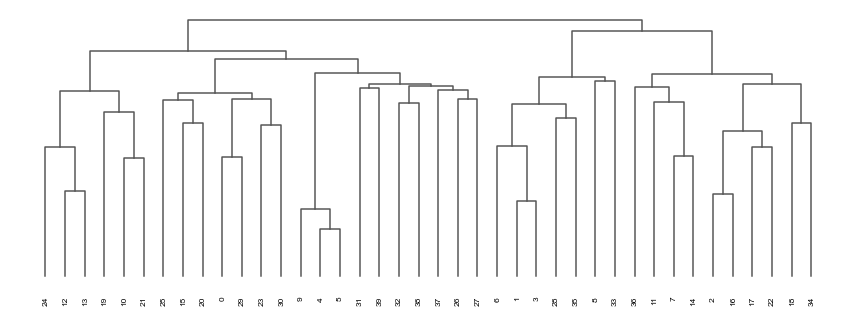

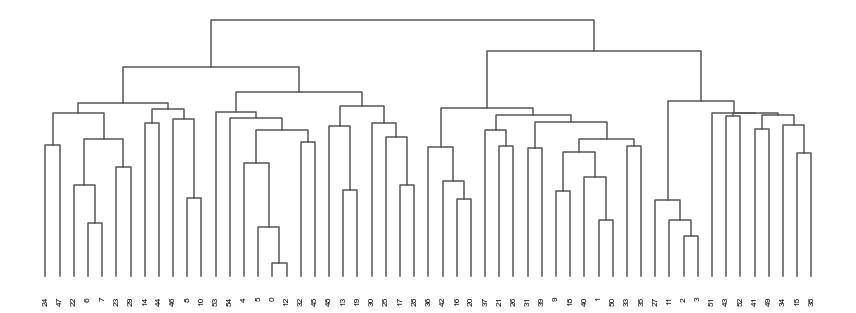

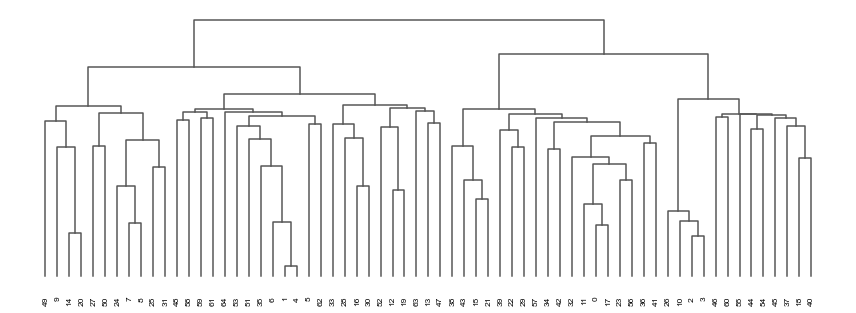

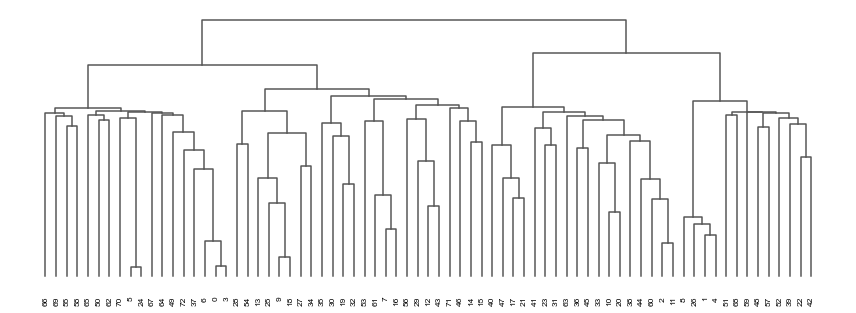

In [ ]:
for leiden_i in leiden_names:
    with rc_context({'figure.figsize': (15, 5)}):
        sc.pl.dendrogram(adata, leiden_i,
                        save = '_'+str(leiden_i))

ranking genes
    consider 'leiden_1' groups:
    with sizes: [4094 3970 2149 2024 1835 1623 1473 1437 1228  878  798  717  686  591
  559  430  393  376  350  333  323  306  278  202  192  179  170  170
  167  164  142   81   78   67   57   56   56   49   34   23]


C:\Users\p0084975\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


    finished: added to `.uns['rank_genes_groups_logreg_leiden_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:01)


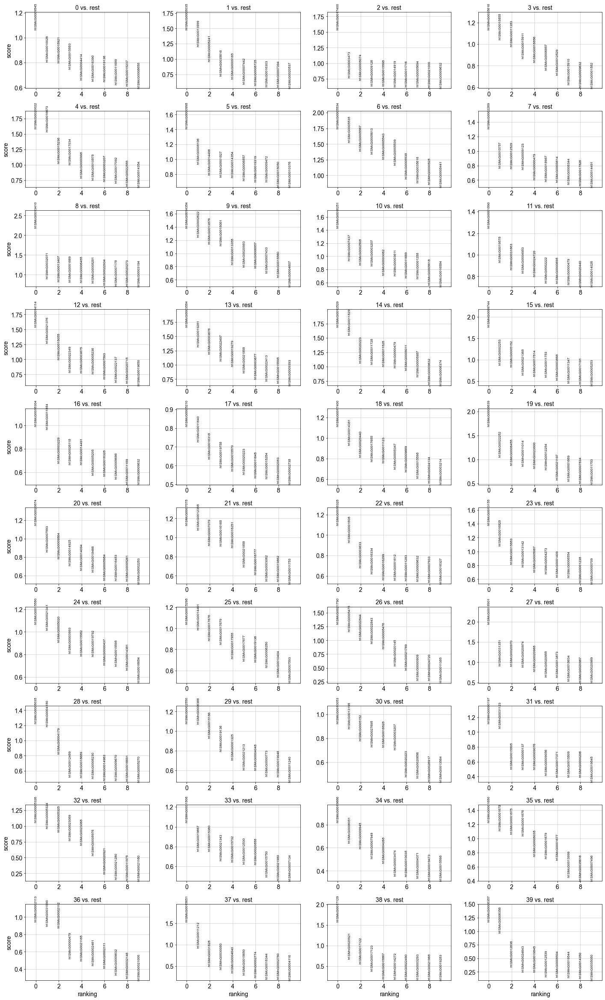

ranking genes
    consider 'leiden_2' groups:
    with sizes: [2989 2601 1802 1607 1434 1171 1111 1045 1036  962  957  894  823  748
  714  602  587  558  532  485  447  429  398  380  352  340  324  315
  308  278  244  200  172  172  170  164  155  148  141  116  113   91
   88   81   70   60   59   56   50   36   36   33   23   17   14]


C:\Users\p0084975\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


    finished: added to `.uns['rank_genes_groups_logreg_leiden_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:27)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is 

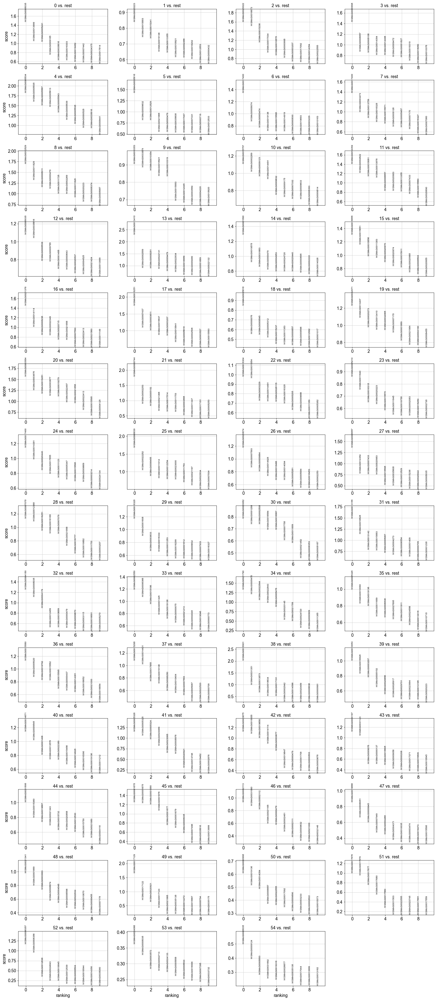

ranking genes
    consider 'leiden_3' groups:
    with sizes: [2157 2111 1791 1586 1556 1414 1117 1107 1045  903  885  759  751  718
  602  585  552  539  528  488  479  439  429  418  402  380  363  352
  341  332  310  278  272  244  208  187  172  170  164  148  141  120
  117  102   91   89   81   79   76   75   56   53   50   43   42   42
   38   33   25   23   23   19   14   13   11]


C:\Users\p0084975\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\

    finished: added to `.uns['rank_genes_groups_logreg_leiden_3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:44)


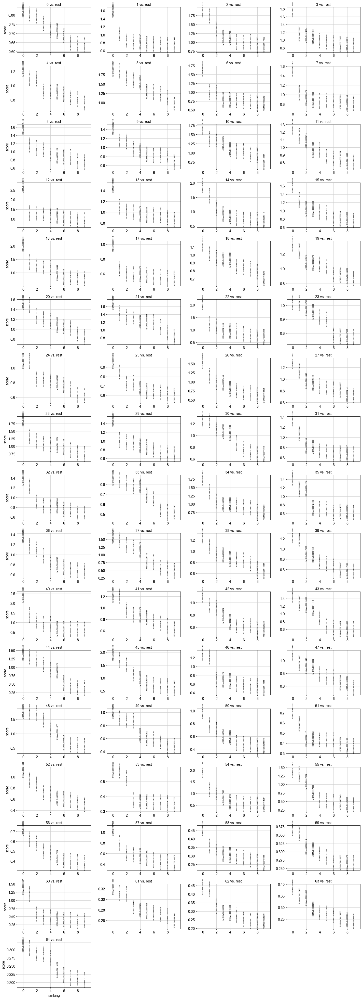

ranking genes
    consider 'leiden_4' groups:
    with sizes: [1909 1767 1689 1578 1548 1005  990  900  895  845  809  756  751  744
  722  703  622  586  552  551  533  440  431  429  413  399  395  381
  352  348  338  331  314  290  278  242  217  184  175  171  150  148
  143  138  137  117  105  102   91   84   83   81   79   76   56   55
   50   43   43   42   41   38   34   33   32   31   27   24   23   14
   14   13    8]


C:\Users\p0084975\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\

    finished: added to `.uns['rank_genes_groups_logreg_leiden_4']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:58)


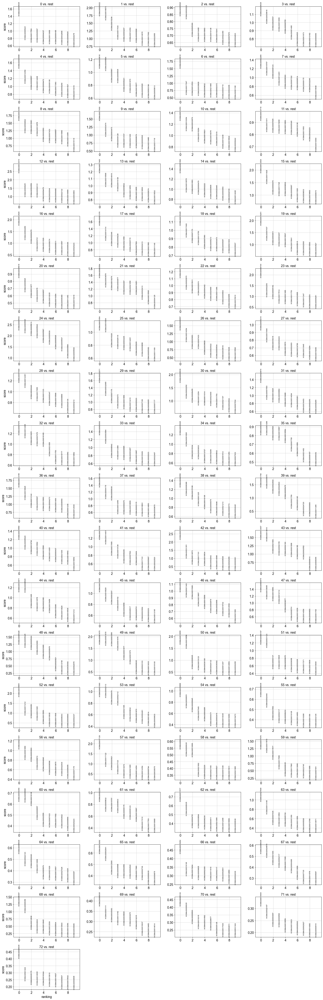

In [ ]:
for leiden_i in leiden_names:
    sc.tl.rank_genes_groups(adata, leiden_i, method='logreg', key_added = 'rank_genes_groups_logreg_'+str(leiden_i))
    sc.pl.rank_genes_groups(adata, key='rank_genes_groups_logreg_'+str(leiden_i), n_genes = 10, sharey = False)

ranking genes
    consider 'leiden_1' groups:
    with sizes: [4094 3970 2149 2024 1835 1623 1473 1437 1228  878  798  717  686  591
  559  430  393  376  350  333  323  306  278  202  192  179  170  170
  167  164  142   81   78   67   57   56   56   49   34   23]


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is 

    finished: added to `.uns['rank_genes_groups_wilcox_leiden_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:26)


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usuall

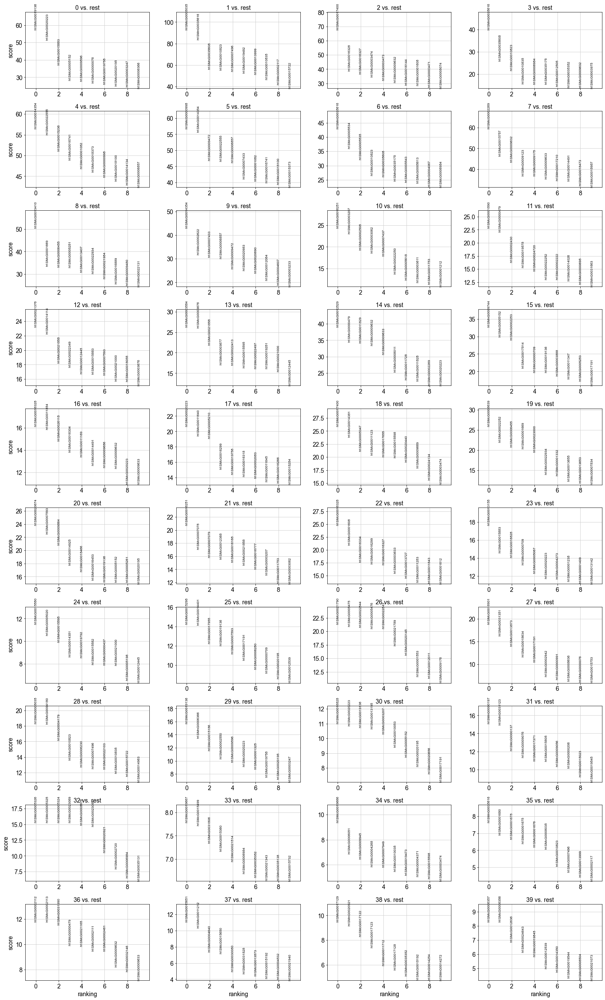

ranking genes
    consider 'leiden_2' groups:
    with sizes: [2989 2601 1802 1607 1434 1171 1111 1045 1036  962  957  894  823  748
  714  602  587  558  532  485  447  429  398  380  352  340  324  315
  308  278  244  200  172  172  170  164  155  148  141  116  113   91
   88   81   70   60   59   56   50   36   36   33   23   17   14]


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is 

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usuall

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually t

    finished: added to `.uns['rank_genes_groups_wilcox_leiden_2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:30)


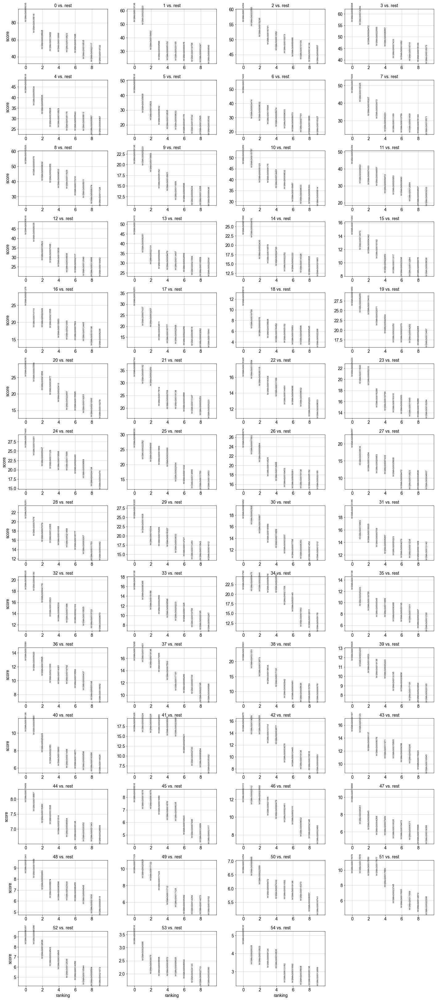

ranking genes
    consider 'leiden_3' groups:
    with sizes: [2157 2111 1791 1586 1556 1414 1117 1107 1045  903  885  759  751  718
  602  585  552  539  528  488  479  439  429  418  402  380  363  352
  341  332  310  278  272  244  208  187  172  170  164  148  141  120
  117  102   91   89   81   79   76   75   56   53   50   43   42   42
   38   33   25   23   23   19   14   13   11]


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is 

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually t

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually t

    finished: added to `.uns['rank_genes_groups_wilcox_leiden_3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:40)


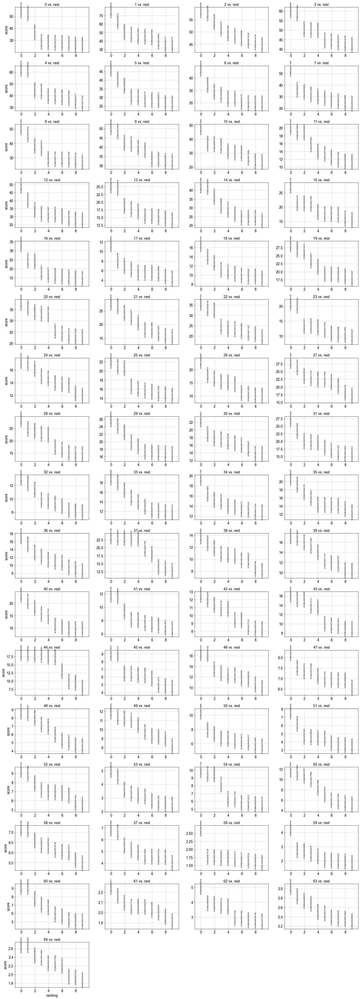

ranking genes
    consider 'leiden_4' groups:
    with sizes: [1909 1767 1689 1578 1548 1005  990  900  895  845  809  756  751  744
  722  703  622  586  552  551  533  440  431  429  413  399  395  381
  352  348  338  331  314  290  278  242  217  184  175  171  150  148
  143  138  137  117  105  102   91   84   83   81   79   76   56   55
   50   43   43   42   41   38   34   33   32   31   27   24   23   14
   14   13    8]


C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is 

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usuall

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usuall

C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals'] = pvals[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:409: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'pvals_adj'] = pvals_adj[global_indices]
C:\Users\p0084975\Anaconda3\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: PerformanceWarning: DataFrame is highly fragmented.  This is usu

    finished: added to `.uns['rank_genes_groups_wilcox_leiden_4']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:41)


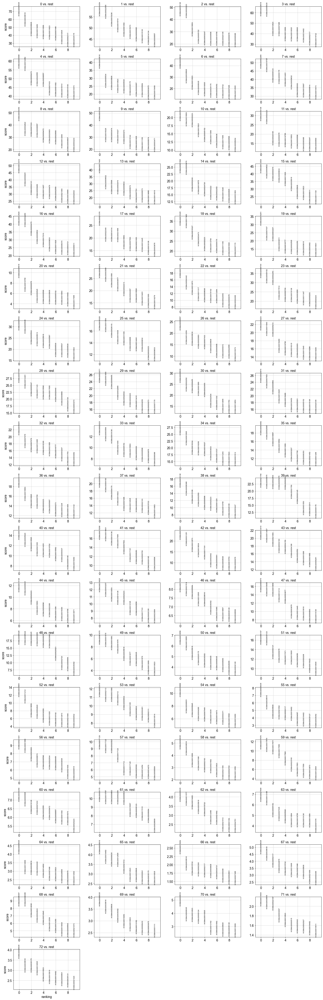

In [ ]:
for leiden_i in leiden_names:
    sc.tl.rank_genes_groups(adata, leiden_i, method='wilcoxon', key_added = 'rank_genes_groups_wilcox_'+str(leiden_i))
    sc.pl.rank_genes_groups(adata, key='rank_genes_groups_wilcox_'+str(leiden_i), n_genes = 10, sharey = False)

# Output files

In [ ]:
adata.write(results_file)

In [ ]:
counts_di = {}
for leiden_i in leiden_names:
    series = []
    total = adata.obs[leiden_i].value_counts().rename(leiden_i + '_' + 'total')
    series.append(total)
    for size in adata.obs['Size'].cat.categories:
        partial = adata.obs[adata.obs['Size'] == size][leiden_i].value_counts().rename(leiden_i + '_' + size)
        series.append(partial)
    counts_di[leiden_i] = pd.concat(series, axis = 1)
    
        

In [ ]:
for key in counts_di.keys():
    counts_di[key].to_excel('outputs/' + key + '.xlsx')

# Markers

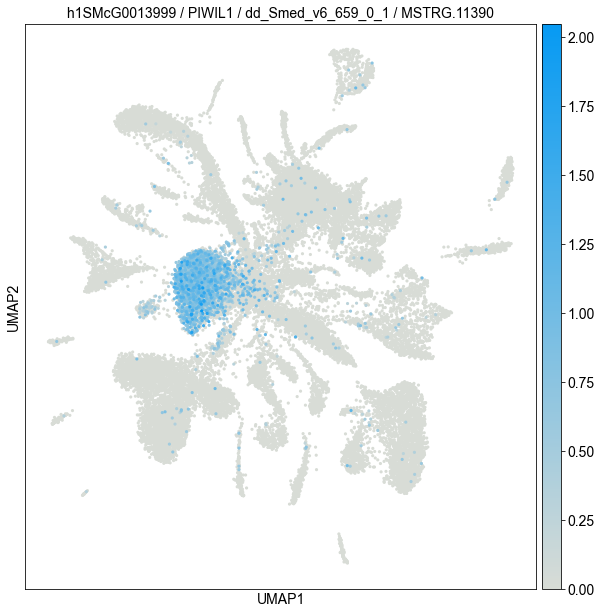

In [ ]:
#Smedwi1
feature = 'h1SMcG0013999'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])
                                              

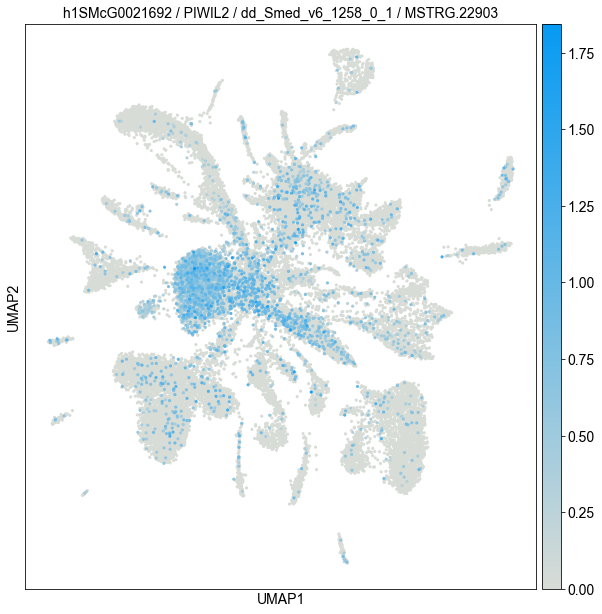

In [ ]:
#Smedwi-3
feature = 'h1SMcG0021692'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

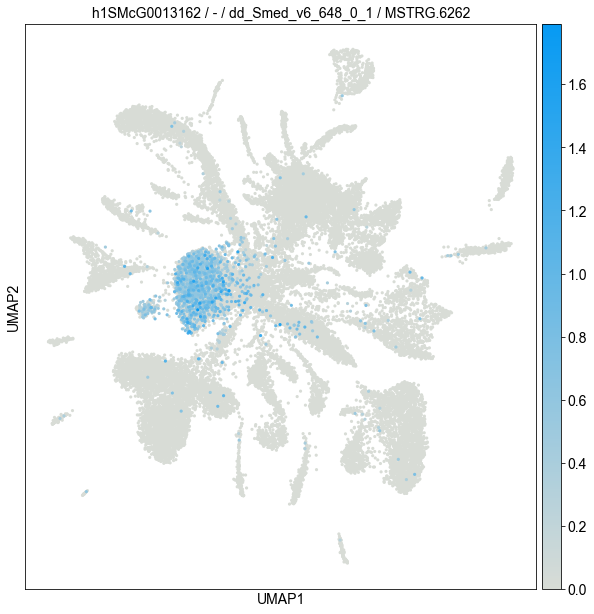

In [ ]:
#tubulin, alpha 3A
feature = 'h1SMcG0013162'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**germ cell progenitors**

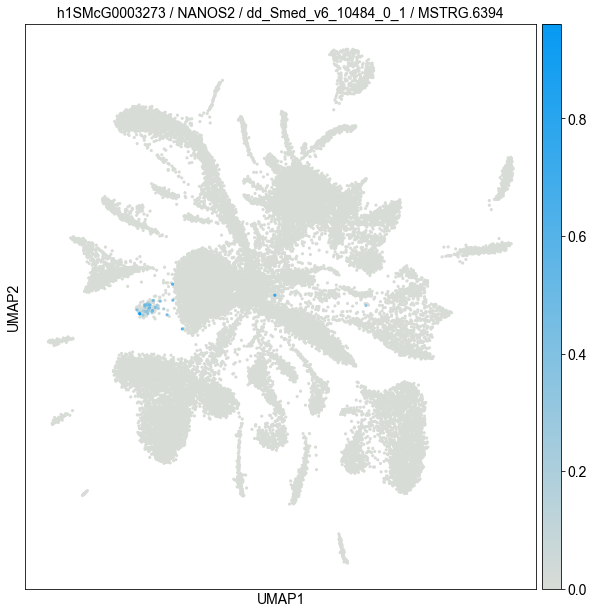

In [ ]:
#nanos
feature = 'h1SMcG0003273'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**early epidermal progenitors**

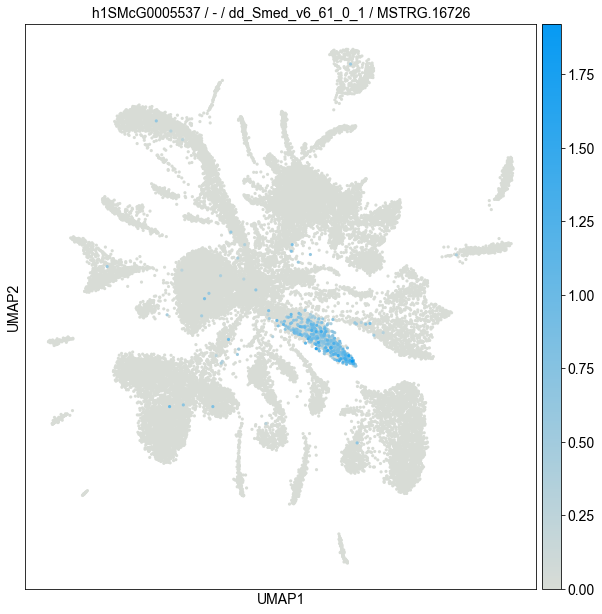

In [ ]:
#early epidermal progenitors
feature = 'h1SMcG0005537'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**late epidermal progenitors**

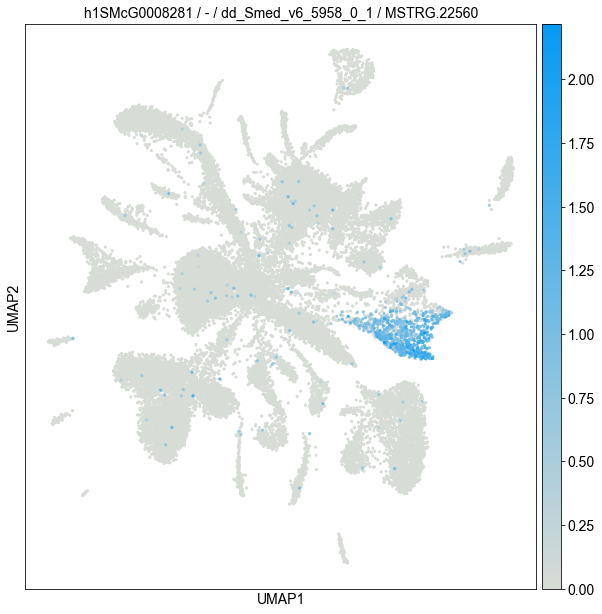

In [ ]:
#late epidermal progenitors 1/2
feature = 'h1SMcG0008281'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

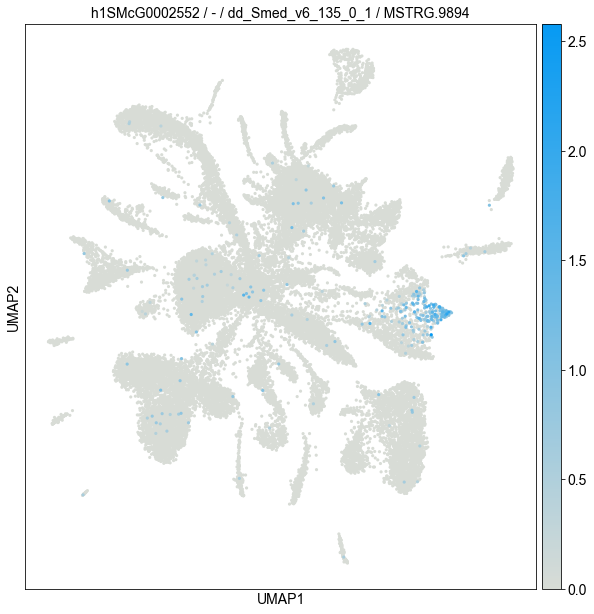

In [ ]:
#late epidermal progenitors 2/1
feature = 'h1SMcG0002552'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**epidermis**

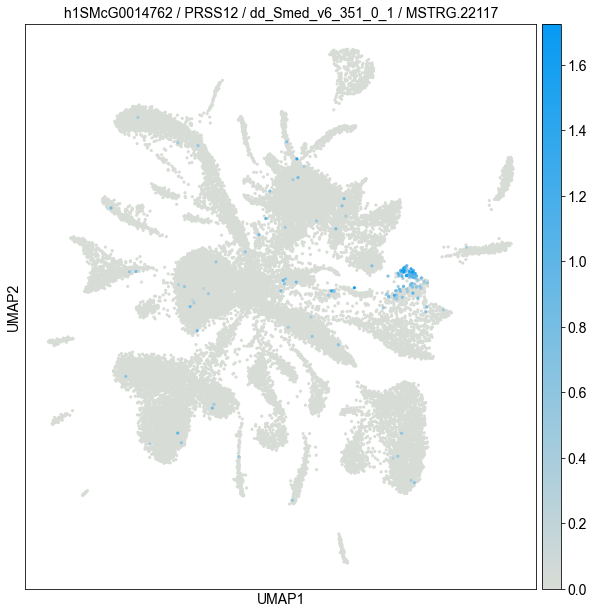

In [ ]:
#epidermis 2
feature = 'h1SMcG0014762'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**epidermis DVb**

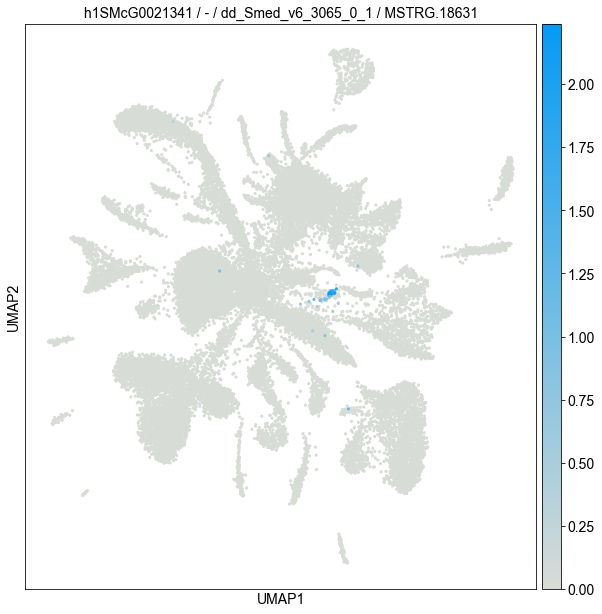

In [ ]:
#epidermis DVb
feature = 'h1SMcG0021341'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**pharynx cell type**

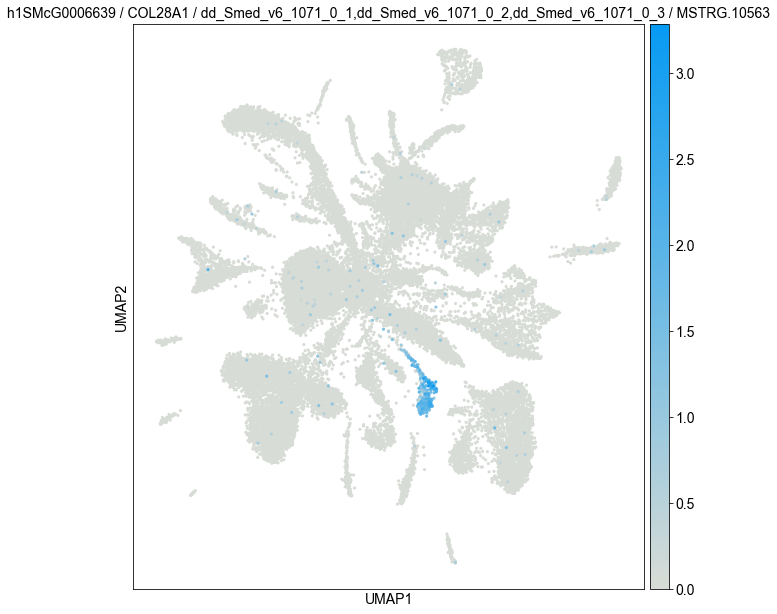

In [ ]:
#pharynx cell type 
feature = 'h1SMcG0006639'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

 **neurons**

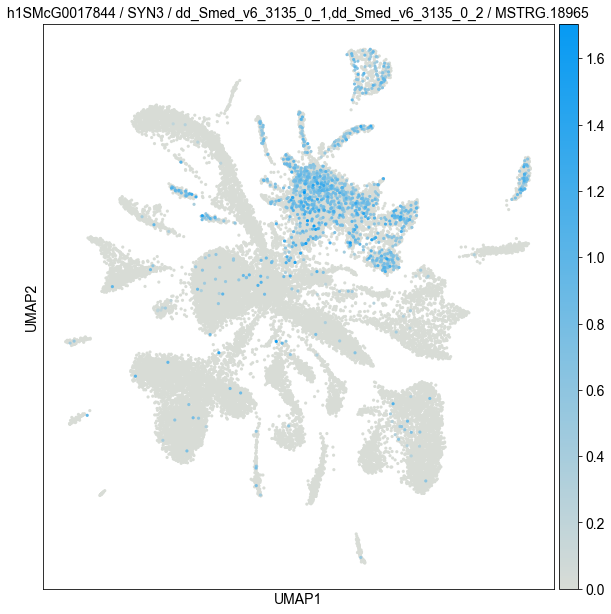

In [ ]:
#pan neural marker syn3
feature = 'h1SMcG0017844'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**ChAT neurons Plass**

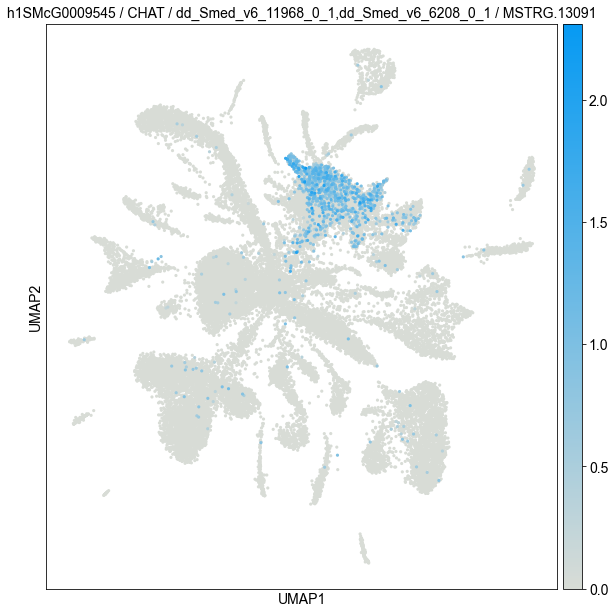

In [ ]:
#chat1
feature = 'h1SMcG0009545'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**GABA neurons Plass**

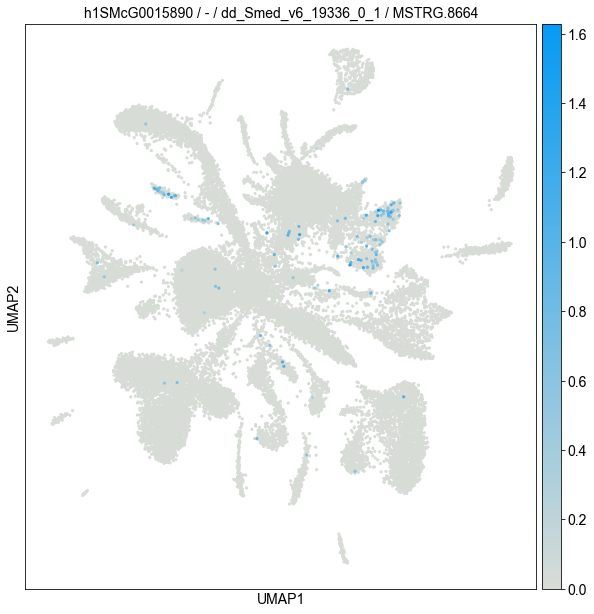

In [ ]:
#gbrb-1 gaba receptor
feature = 'h1SMcG0015890'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

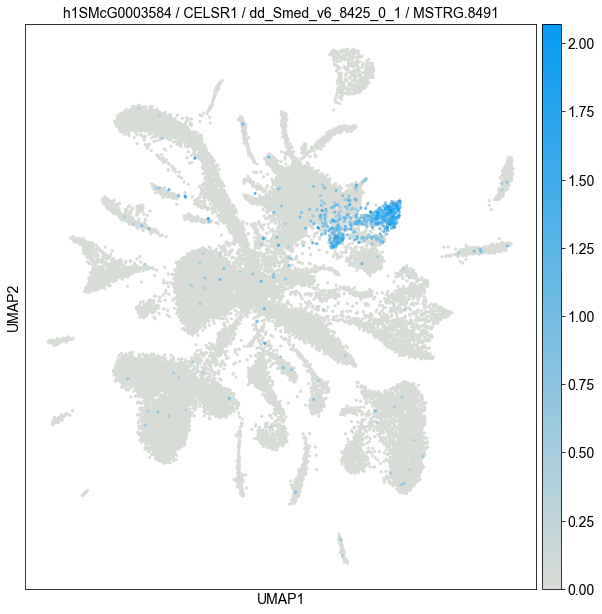

In [ ]:
#cadherin
feature = 'h1SMcG0003584'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**cav-1 neurons**

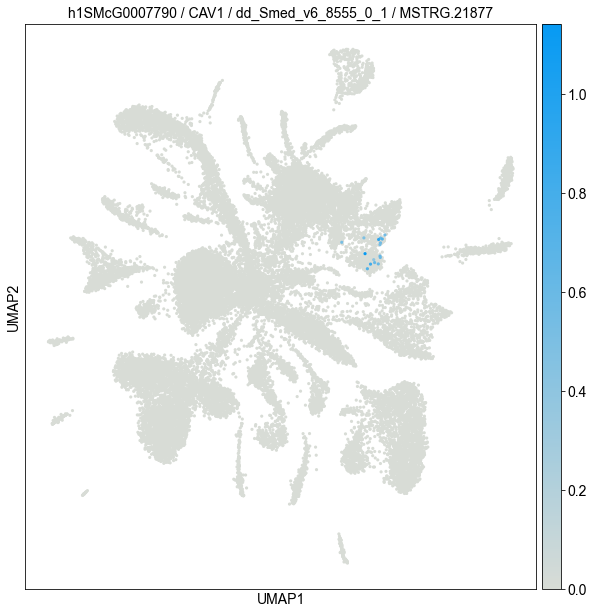

In [ ]:
#cav-1
feature = 'h1SMcG0007790'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**serotoninergic neurons**

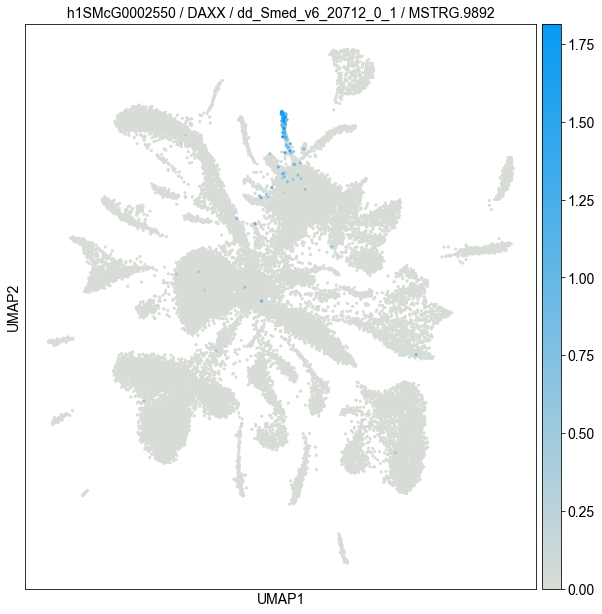

In [ ]:
#serotonin neurons
feature = 'h1SMcG0002550'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

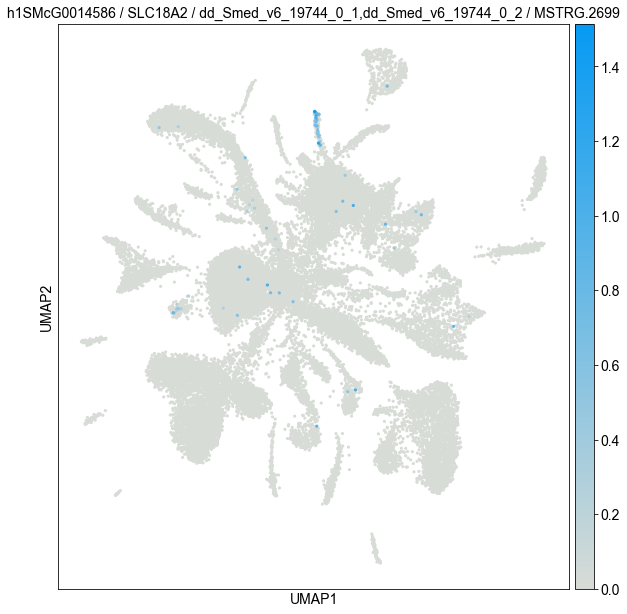

In [ ]:
#serotonin neurons
feature = 'h1SMcG0014586'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**photoreceptors**

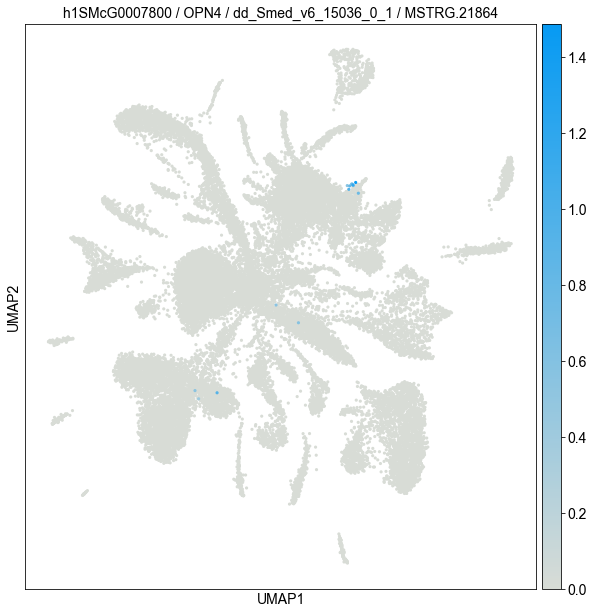

In [ ]:
# R opsin
feature = 'h1SMcG0007800'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**otf**

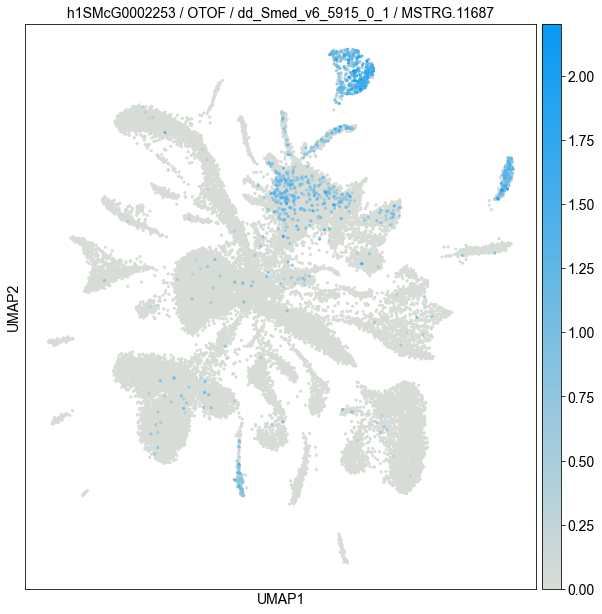

In [ ]:
#otf
feature = 'h1SMcG0002253'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**otf+ cells 2**

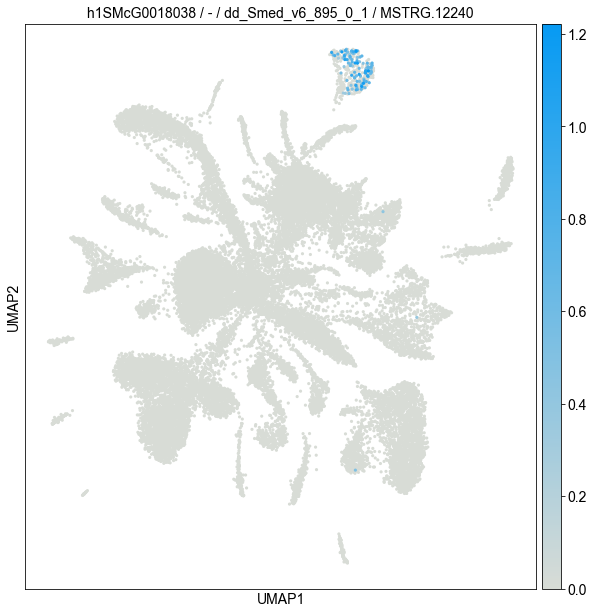

In [ ]:
#Insulin-like growth factor binding protein
feature = 'h1SMcG0018038'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**otf+ cells 2**

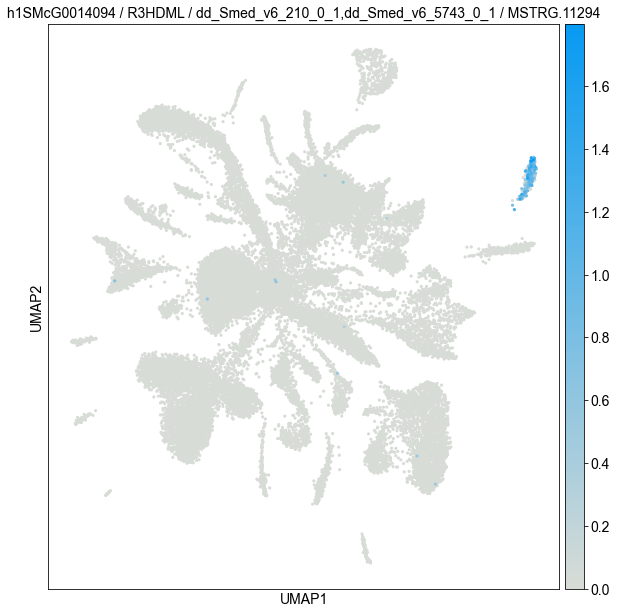

In [ ]:
#GLI pathogenesis related 1
feature = 'h1SMcG0014094'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**muscle**

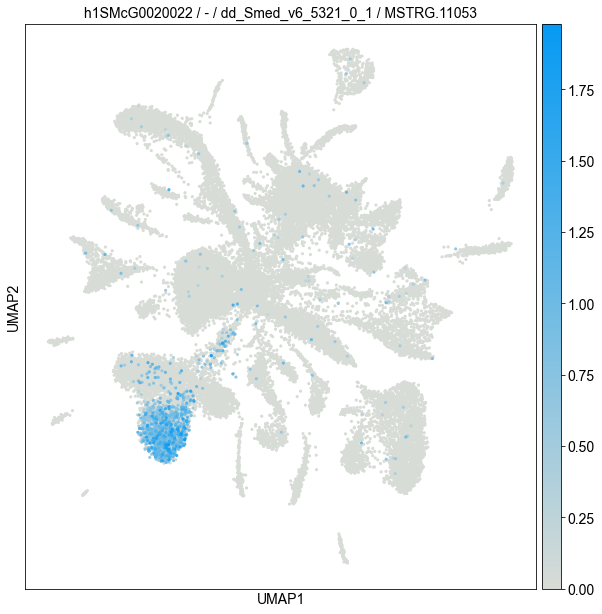

In [ ]:
#body wall muscle
feature = 'h1SMcG0020022'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

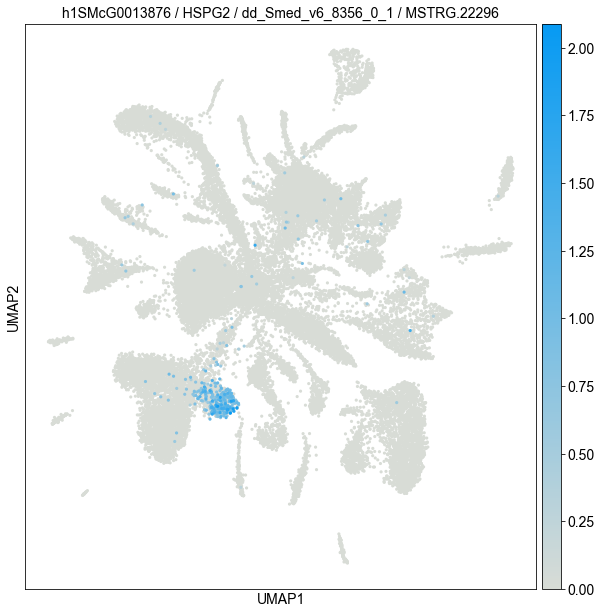

In [ ]:
# pharynx muscle
feature = 'h1SMcG0013876'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

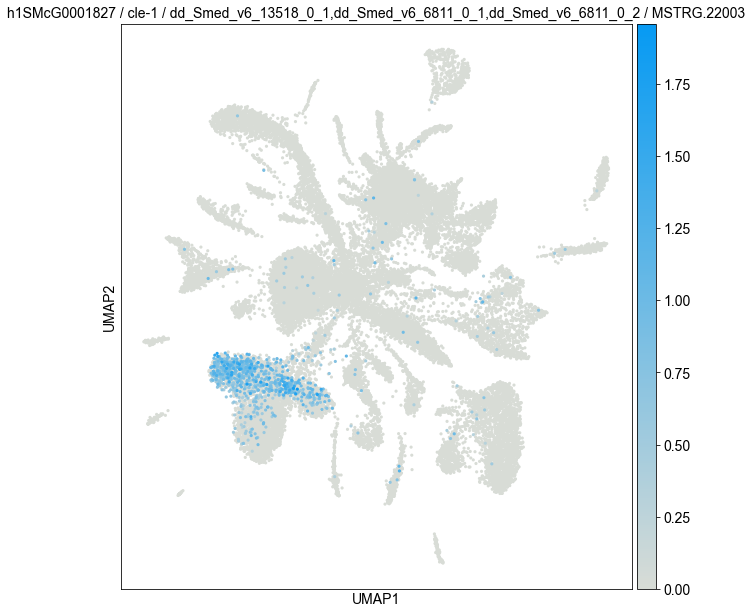

In [ ]:
#intestinal and DV muscle
feature = 'h1SMcG0001827'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**late muscle marker**

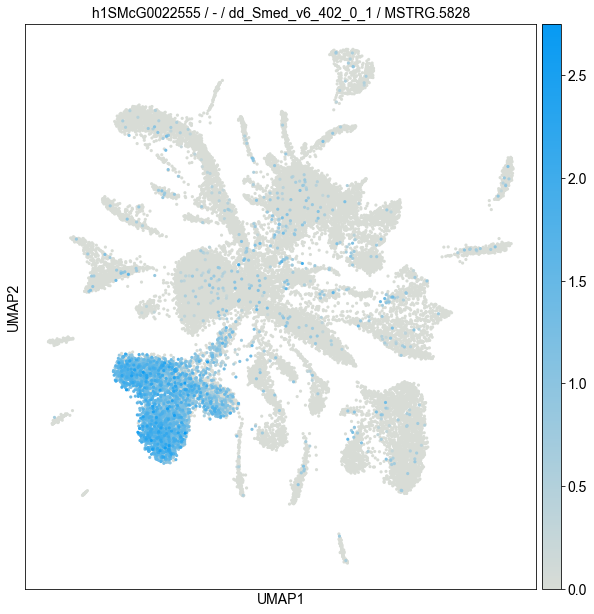

In [ ]:
#late muscle
feature = 'h1SMcG0022555'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

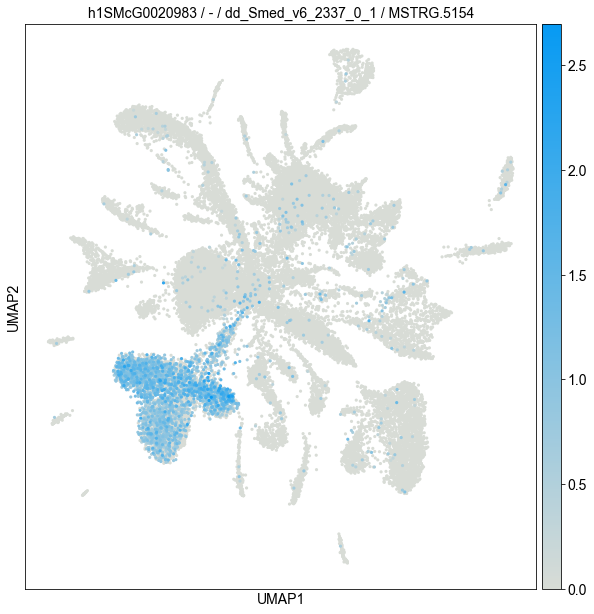

In [ ]:
#early muscle (with progenitors)
feature = 'h1SMcG0020983'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

 **parenchymal cells**

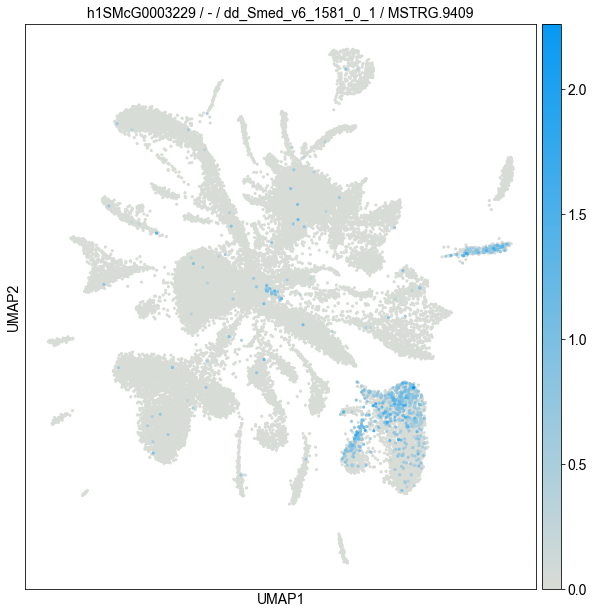

In [ ]:
#ldlrr-1
feature = 'h1SMcG0003229'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

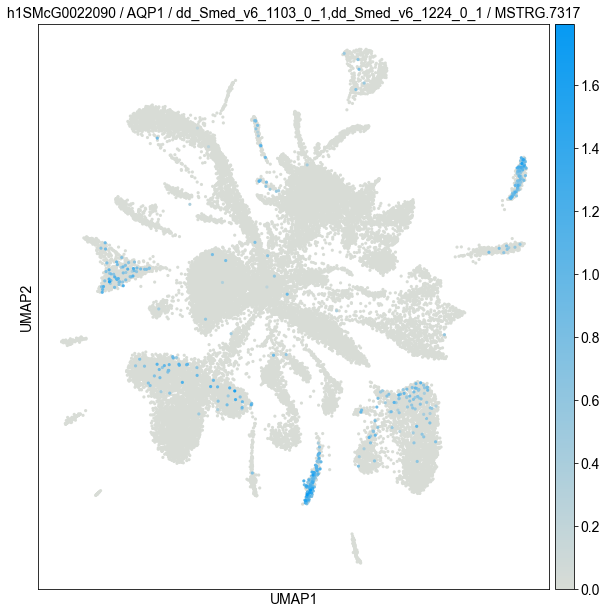

In [ ]:
#aqp
feature = 'h1SMcG0022090'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

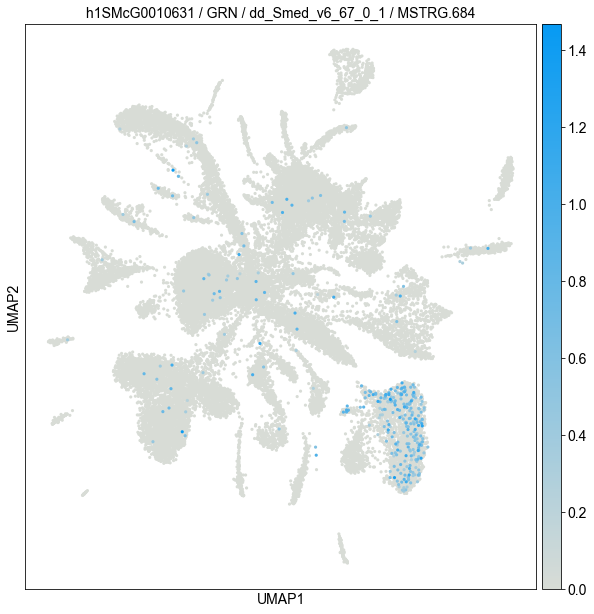

In [ ]:
#pgrn
feature = 'h1SMcG0010631'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

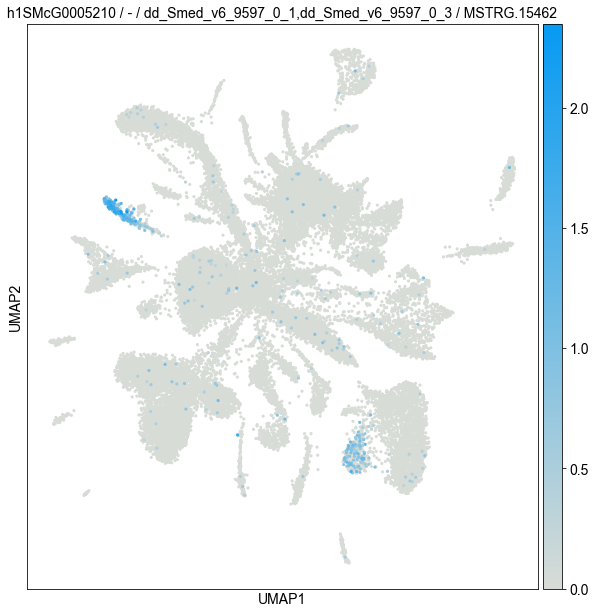

In [ ]:
#psap
feature = 'h1SMcG0005210'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

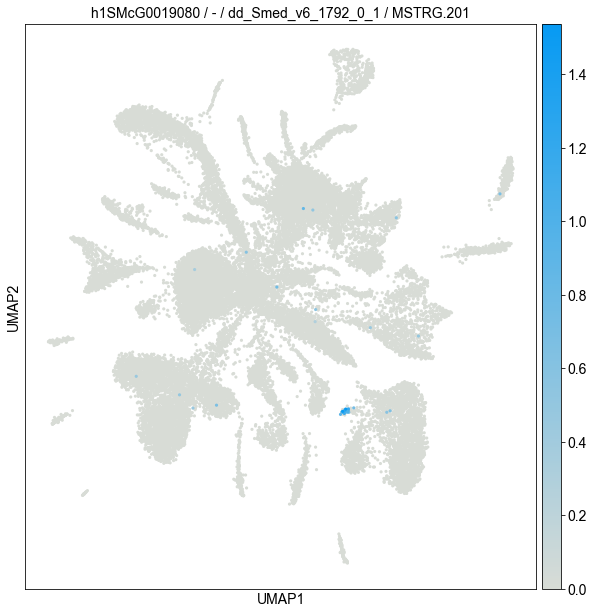

In [ ]:
#glia
feature = 'h1SMcG0019080'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

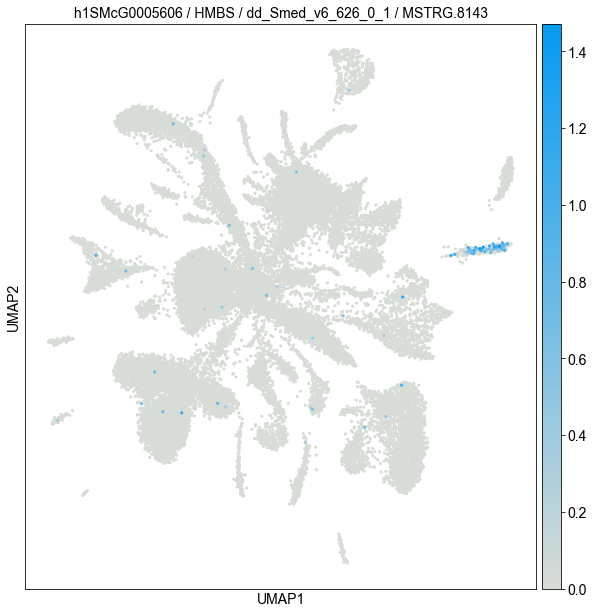

In [ ]:
#pbgd-1
feature = 'h1SMcG0005606'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**phagocytes**

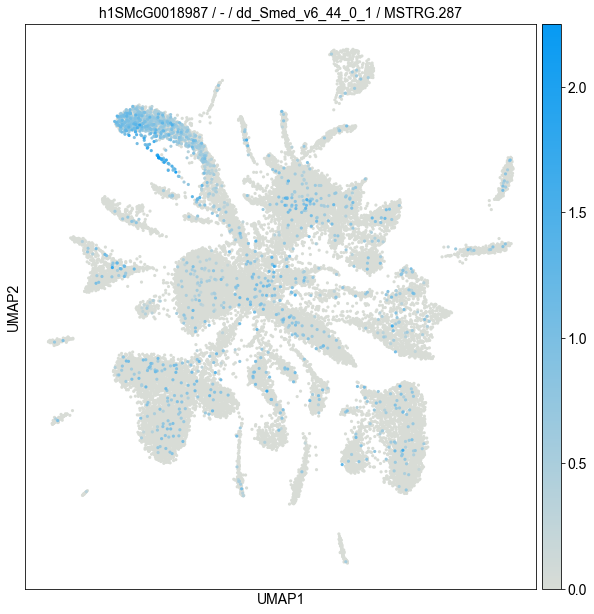

In [ ]:
#phagocytes
feature = 'h1SMcG0018987'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

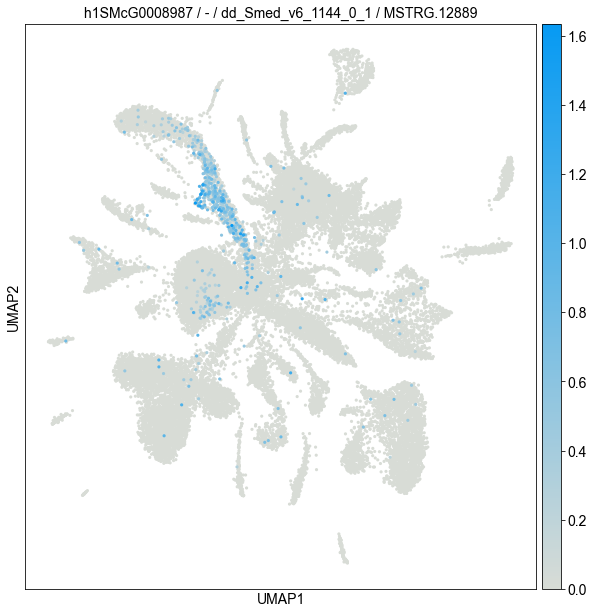

In [ ]:
#phagocyte progenitors
feature = 'h1SMcG0008987'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

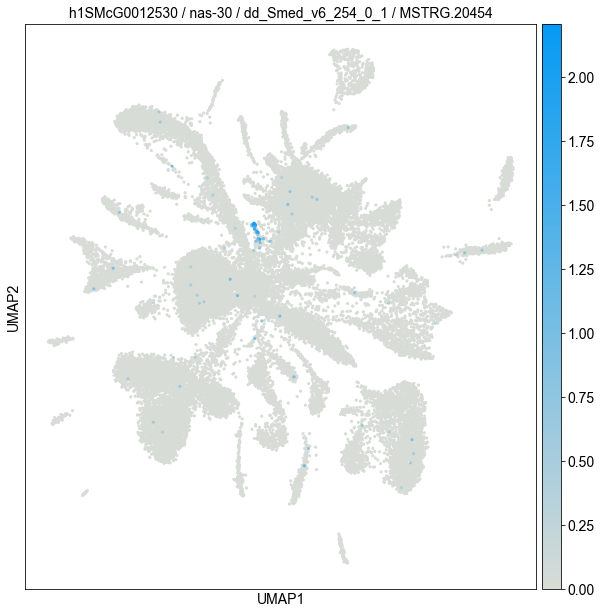

In [ ]:
#goblet cells
feature = 'h1SMcG0012530'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

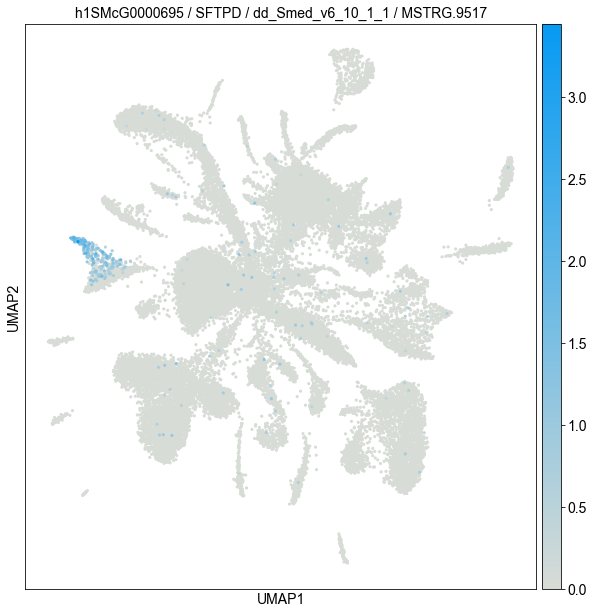

In [ ]:
#basal cells - goblet cell progenitors
feature = 'h1SMcG0000695'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

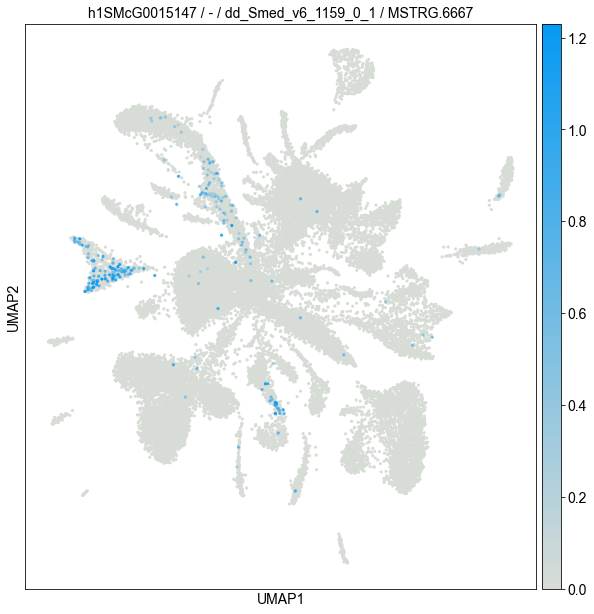

In [ ]:
#slc22a6
feature = 'h1SMcG0015147'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

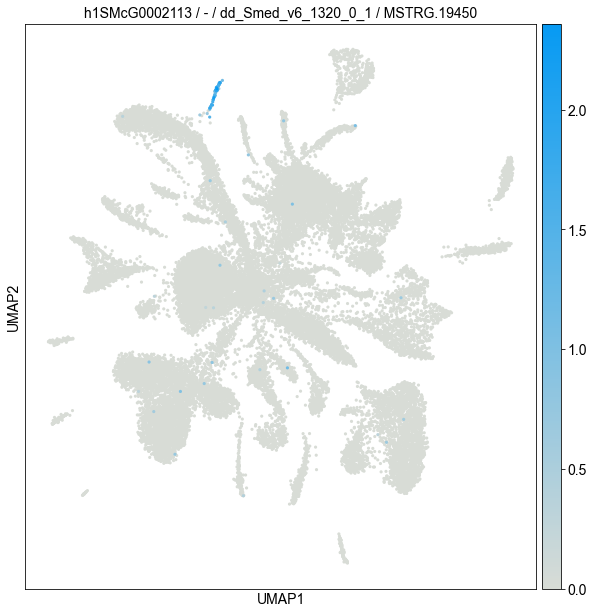

In [ ]:
#psd cells
feature = 'h1SMcG0002113'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**protonephridia flame cells**

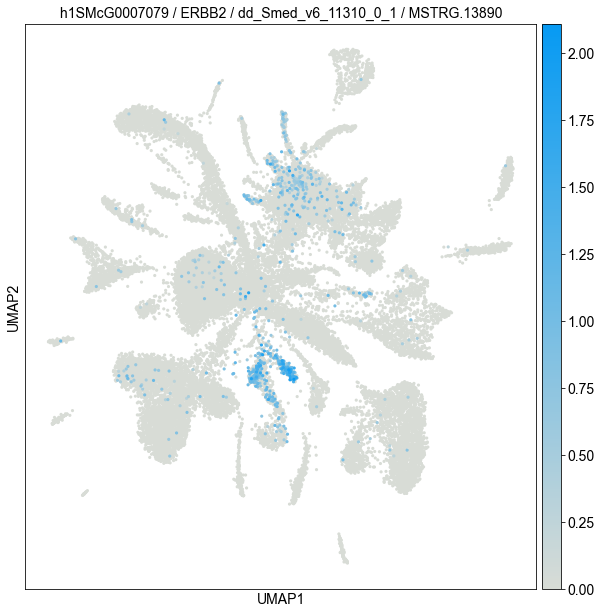

In [ ]:
#protonephridia flame cells
feature = 'h1SMcG0007079'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**protonephridia tubule cells**

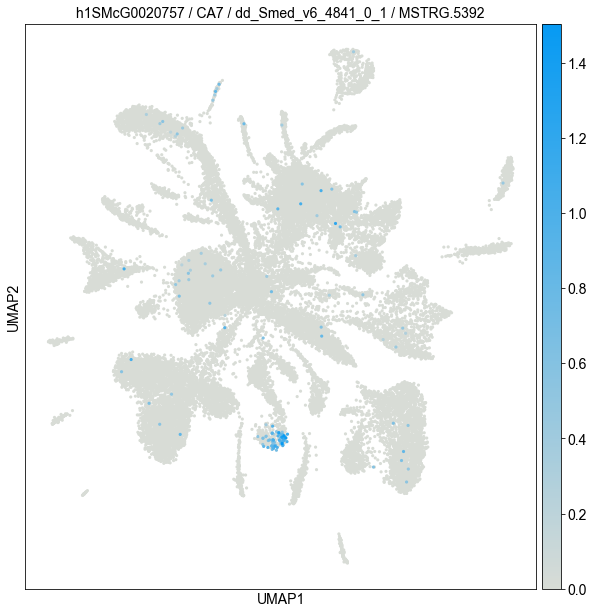

In [ ]:
#cavII-1
feature = 'h1SMcG0020757'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

**secretory**

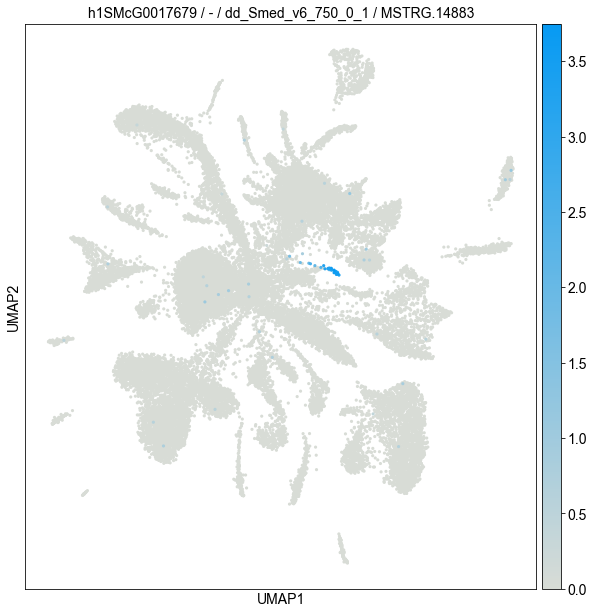

In [ ]:
#secretory 1 - lemA-like plass et al
feature = 'h1SMcG0017679'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

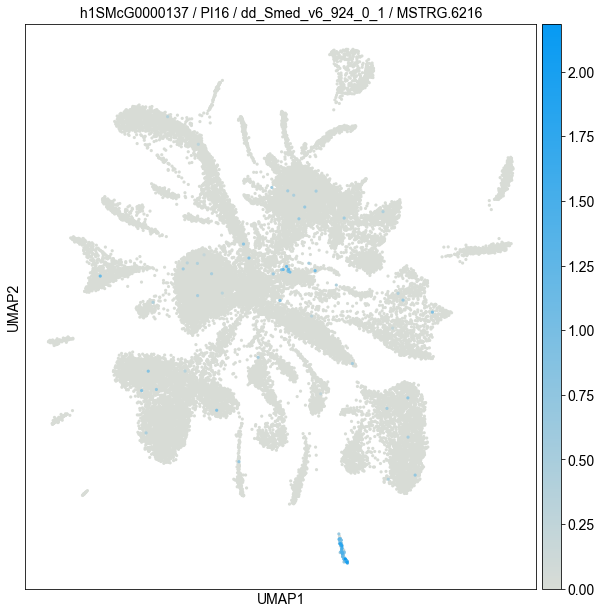

In [ ]:
#secretory 3 glipr-1 #plass et al
feature = 'h1SMcG0000137'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

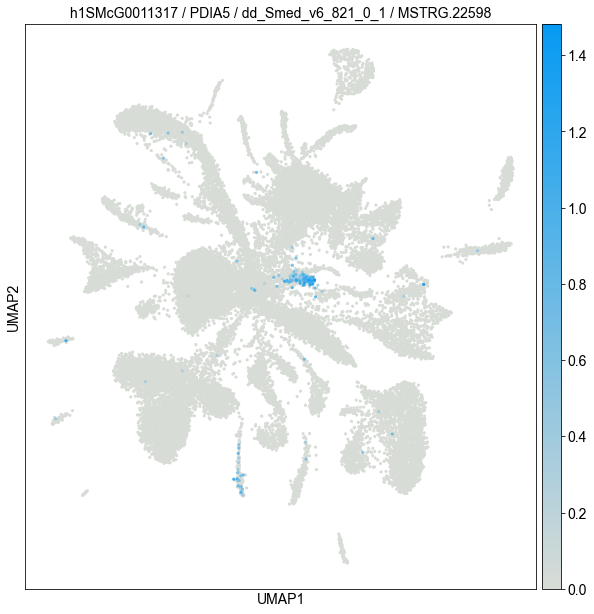

In [ ]:
#secretory 4 pdi-1 #plass et al
feature = 'h1SMcG0011317'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

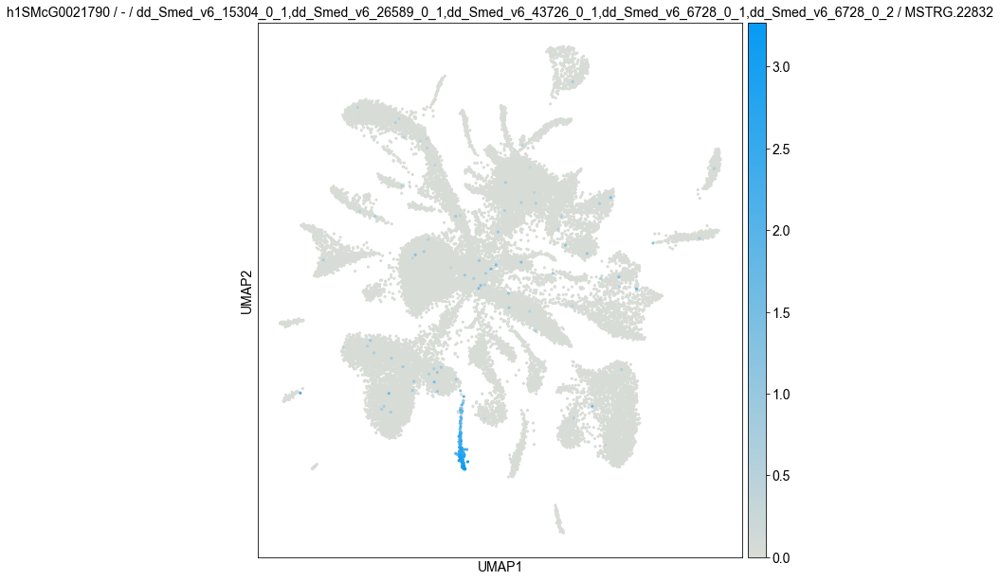

In [ ]:
#secretory 2 garcia castro et al
feature = 'h1SMcG0021790'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

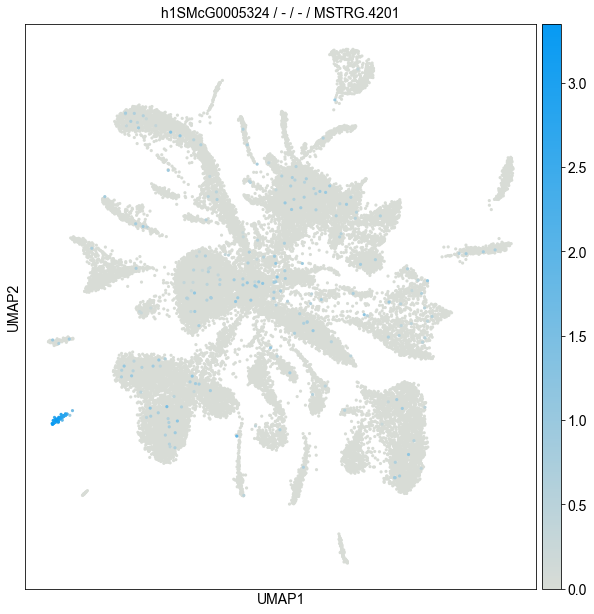

In [ ]:
#secretory 3 garcia castro et al
feature = 'h1SMcG0005324'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

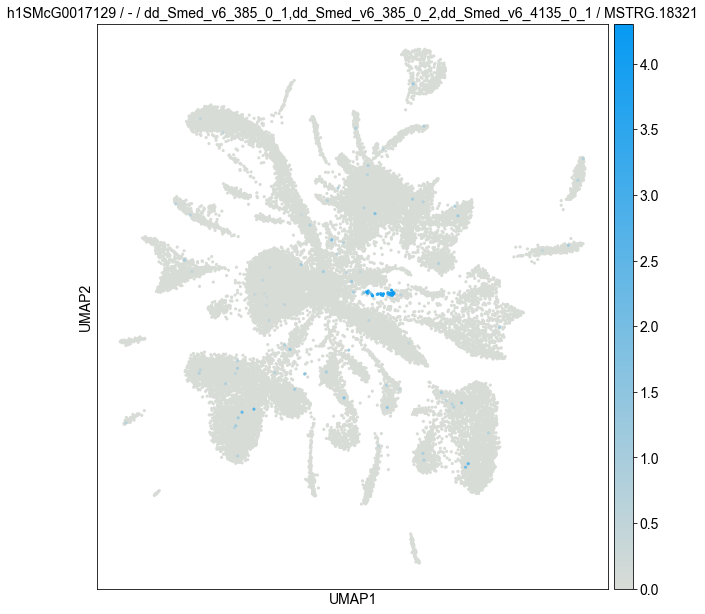

In [ ]:
#secretory 4 #garcia castro et al
feature = 'h1SMcG0017129'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

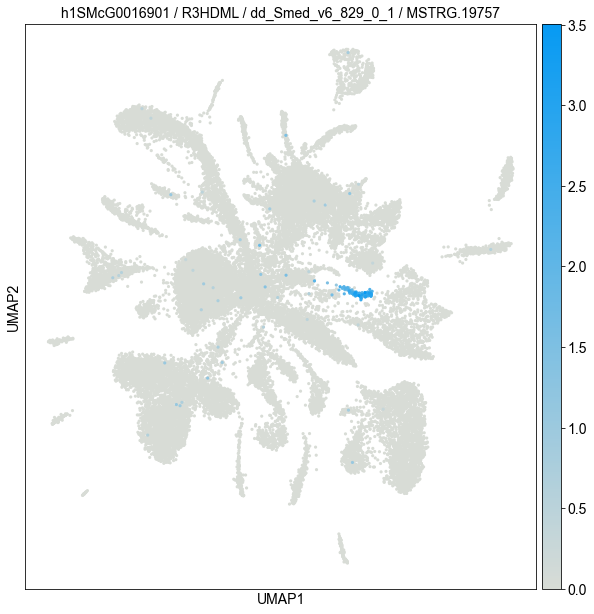

In [ ]:
#secretory 5 garcia castro et al
feature = 'h1SMcG0016901'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])

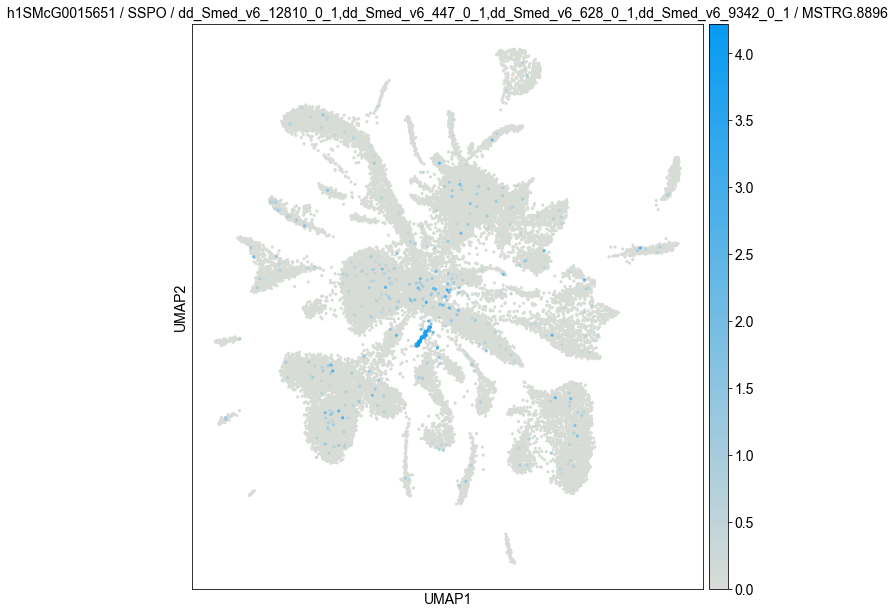

In [ ]:
#secretory 6 garcia castro et al
feature = 'h1SMcG0015651'
with rc_context({'figure.figsize': (10, 10)}):
    sc.pl.umap(adata, color= feature, size = 40, cmap = umap_cmap, 
               title = feature + " / " + 
               adata.raw.var.loc[feature]['Preferred_name'] + " / " + 
               adata.raw.var.loc[feature]['ddv6_collapsed'] + " / " +
               adata.raw.var.loc[feature]['gene_Jakke_ver1'])